# Q2L-MMRDR: Multi-Label Retinal Lesion Detection
## RETFound (ViT-Large/16) + Query2Label + Asymmetric Loss

---

### Architecture
```
(B, 3, 512, 512) image
    → RETFound ViT-Large/16 (MAE-pretrained) → (B, 1024, 32, 32)
      [drop CLS token, reshape 1024 patch tokens back to a 32x32 grid]
    → Flatten + 2D sinusoidal PE → (B, 1024, 1024)
    → 1 Encoder layer (global context)
    → 2 Decoder layers (7 label queries × 1024 spatial tokens)
    → Linear(1024,1) × 7 → (B, 7) logits
    → ASL (gamma_pos=0, gamma_neg=4, clip=0.05)
```

### Lesion Classes
| Idx | Lesion | Abbreviation | DR Stage |
|-----|--------|-------------|----------|
| 0 | Microaneurysm | MA | Mild NPDR |
| 1 | Hard Exudate | HE | Moderate NPDR |
| 2 | Intraretinal Hemorrhage | IH | Moderate NPDR |
| 3 | Venous Beading / IRMA | VB/IRMA | Severe NPDR |
| 4 | Neovascularization | NV | PDR |
| 5 | Vitreous Hemorrhage | VH | PDR |
| 6 | Retinal Detachment | RD | PDR |

### Experiments
| Exp | Data | Balanced | CMQC | Purpose |
|-----|------|----------|------|---------|
| **A** | CFP only | No | No | CFP baseline |
| **B** | UWF only | No | No | UWF baseline |
| **C** | CFP+UWF | Yes | No | Joint training value |
| **D** | CFP+UWF | Yes | Yes | Modality conditioning value |

---
## Section 2 — Environment Check

In [1]:
import sys, os, platform
import torch
import timm
import numpy as np
import pandas as pd
import matplotlib

print(f"Python:     {sys.version.split()[0]}")
print(f"Platform:   {platform.system()} {platform.release()}")
print(f"PyTorch:    {torch.__version__}")
print(f"Timm:       {timm.__version__}")
print(f"NumPy:      {np.__version__}")
print(f"Pandas:     {pd.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"CUDA:       {torch.cuda.is_available()}")
if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    print(f"GPU count:  {n_gpu}  (train.py pins CUDA_VISIBLE_DEVICES=3 -> single-GPU training only)")
    print(f"GPU:        {torch.cuda.get_device_name(0)}")
    mem = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"GPU Memory: {mem:.1f} GB")
    print(f"cuDNN:      {torch.backends.cudnn.version()}")
    if n_gpu > 1:
        print(f"NOTE: {n_gpu} GPUs are attached to this session, but DataParallel has been")
        print("      removed from this project (root-cause of the RAM-growth kernel death).")
        print("      Only GPU 0 is used; the extra GPU(s) are intentionally left idle.")

Python:     3.10.18
Platform:   Linux 6.17.0-35-generic
PyTorch:    2.8.0+cu128
Timm:       1.0.27
NumPy:      2.1.3
Pandas:     2.3.1
Matplotlib: 3.10.5
CUDA:       True
GPU count:  1  (train.py pins CUDA_VISIBLE_DEVICES=3 -> single-GPU training only)
GPU:        NVIDIA RTX 2000 Ada Generation
GPU Memory: 16.7 GB
cuDNN:      91002


In [2]:
# ── Local Setup & Config Verification ────────────────────────────────────────
# On Kaggle, this cell extracted code from /kaggle/input and patched
# config.py at runtime. Locally, the code already sits alongside the
# notebook and config.py has been patched permanently.

import pathlib, sys

NOTEBOOK_DIR = pathlib.Path('/home/user2/sanchit/RETFound_Q2L')
PROJECT_ROOT = pathlib.Path('/home/user2/mydisk/sanchit')
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# Verify code is in place
assert (PROJECT_ROOT / 'src' / '__init__.py').exists(), \
    'src/ package not found \u2014 expected at /home/user2/mydisk/sanchit/src'
assert (PROJECT_ROOT / 'train.py').exists(), 'train.py not found'
assert (PROJECT_ROOT / 'evaluate.py').exists(), 'evaluate.py not found'

# Verify top-level project resource directories are in place
assert (PROJECT_ROOT / 'dataset').exists(), \
    f'Missing dataset/ directory \u2014 expected at {PROJECT_ROOT / "dataset"}'
assert (PROJECT_ROOT / 'weights').exists(), \
    f'Missing weights/ directory \u2014 expected at {PROJECT_ROOT / "weights"}'

# Verify the critical resources needed before training can start
# (fail immediately here rather than discovering this deep into a run)
assert (PROJECT_ROOT / 'weights' / 'RETFound_mae_meh.pth').exists(), (
    f'Missing RETFound backbone weights \u2014 expected at '
    f'{PROJECT_ROOT / "weights" / "RETFound_mae_meh.pth"}'
)
assert (PROJECT_ROOT / 'dataset' / 'MMRDR-CFP').exists(), (
    f'Missing CFP dataset \u2014 expected at '
    f'{PROJECT_ROOT / "dataset" / "MMRDR-CFP"}'
)
assert (PROJECT_ROOT / 'dataset' / 'MMRDR-UWF').exists(), (
    f'Missing UWF dataset \u2014 expected at '
    f'{PROJECT_ROOT / "dataset" / "MMRDR-UWF"}'
)

# Verify config values match Kaggle training
from src.config import get_config
_cfg = get_config('a')
print('Config verification:')
print(f'  batch_size:     {_cfg.batch_size}')
print(f'  ema_decay:      {_cfg.ema_decay}')
print(f'  patience:       {_cfg.patience}')
print(f'  freeze_blocks:  {_cfg.freeze_blocks}')
print(f'  asl_gamma_neg:  {_cfg.asl_gamma_neg}')
print(f'  asl_clip:       {_cfg.asl_clip}')
print(f'  num_workers:    {_cfg.num_workers}')

# Create output dirs
for d in ['outputs', 'outputs/export']:
    (PROJECT_ROOT / d).mkdir(parents=True, exist_ok=True)
assert (PROJECT_ROOT / 'outputs').exists(), \
    f'Failed to create outputs/ directory at {PROJECT_ROOT / "outputs"}'
print('\n\u2713 Local setup complete')


Config verification:
  batch_size:     8
  ema_decay:      0.999
  patience:       15
  freeze_blocks:  []
  asl_gamma_neg:  6.0
  asl_clip:       0.1
  num_workers:    4

✓ Local setup complete


In [3]:
# ── Dataset Verification (Local) ─────────────────────────────────────────────
# On Kaggle, this cell extracted MMRDR.zip.001…009 into /tmp.
# Locally, the dataset must already be extracted.

import pathlib

DATA_DIR = pathlib.Path('/home/user2/mydisk/sanchit/dataset')

for name in ['MMRDR-CFP', 'MMRDR-UWF']:
    d = DATA_DIR / name
    assert d.exists(), (
        f'Missing: {d}\n'
        f'Extract the MMRDR dataset so that MMRDR-CFP/ and MMRDR-UWF/ '
        f'are siblings of train.py in {DATA_DIR}'
    )
    img_dir = d / 'img'
    count = len(list(img_dir.glob('*'))) if img_dir.exists() else 0
    csvs = list(d.glob('*.csv'))
    print(f'  \u2713 {name}: {count} images, {len(csvs)} CSV(s)')

print('\n\u2713 Dataset verified')


  ✓ MMRDR-CFP: 11118 images, 1 CSV(s)
  ✓ MMRDR-UWF: 10404 images, 1 CSV(s)

✓ Dataset verified


In [4]:
# ── Project root and paths ───────────────────────────────────────────────────
import pathlib
import sys
import os

NOTEBOOK_DIR = pathlib.Path('/home/user2/sanchit/RETFound_Q2L')
PROJECT_ROOT = str(pathlib.Path('/home/user2/mydisk/sanchit'))
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

DATA_DIR = pathlib.Path(PROJECT_ROOT) / 'dataset'

print(f'Project root: {PROJECT_ROOT}')
print(f'Contents: {[p.name for p in pathlib.Path(PROJECT_ROOT).iterdir() if not p.name.startswith(".")]}')

# Verify dataset
for d in ['MMRDR-CFP', 'MMRDR-UWF']:
    p = DATA_DIR / d
    assert p.exists(), f'Missing: {p}'
    img_count = len(list((p / 'img').glob('*'))) if (p / 'img').exists() else 0
    print(f'  {d}: OK ({img_count} images)')

# Create output directories
for _d in ['outputs', 'outputs/export']:
    os.makedirs(str(pathlib.Path(PROJECT_ROOT) / _d), exist_ok=True)
print('\u2713 outputs/ directories ready')


Project root: /home/user2/mydisk/sanchit
Contents: ['dataset', 'evaluate.py', 'outputs', 'src', 'train.py', 'weights']
  MMRDR-CFP: OK (11118 images)
  MMRDR-UWF: OK (10404 images)
✓ outputs/ directories ready


In [5]:
# ── GPU & System Status ──────────────────────────────────────────────────────
import shutil as _sh, pathlib, torch

def _disk(p):
    try:
        u, _, f = _sh.disk_usage(p); return u/1e9, f/1e9
    except Exception:
        return 0.0, 0.0

# Show disk usage for the project directory
pu, pf = _disk(PROJECT_ROOT)
print(f'Project dir : {pu:.1f} GB used  |  {pf:.1f} GB free')

if torch.cuda.is_available():
    a = torch.cuda.memory_allocated()/1e9
    r = torch.cuda.memory_reserved()/1e9
    t = torch.cuda.get_device_properties(0).total_memory/1e9
    print(f'GPU         : {a:.2f} GB alloc  |  {r:.2f} GB reserved  |  {t:.1f} GB total')
    print(f'GPU name    : {torch.cuda.get_device_name(0)}')

# Show existing checkpoints
ckpt_files = list(pathlib.Path(PROJECT_ROOT, 'outputs').rglob('*.pth')) \
             if pathlib.Path(PROJECT_ROOT, 'outputs').exists() else []
if ckpt_files:
    ckpt_mb = sum(p.stat().st_size for p in ckpt_files) / 1e6
    print(f'\nCheckpoint files: {len(ckpt_files)} files, {ckpt_mb:.0f} MB total')
    for p in sorted(ckpt_files):
        print(f'  {p.relative_to(pathlib.Path(PROJECT_ROOT, "outputs"))}  ({p.stat().st_size/1e6:.0f} MB)')
else:
    print('\nNo checkpoint files found yet.')


Project dir : 4000.8 GB used  |  1058.4 GB free
GPU         : 0.00 GB alloc  |  0.00 GB reserved  |  16.7 GB total
GPU name    : NVIDIA RTX 2000 Ada Generation

Checkpoint files: 7 files, 28267 MB total
  exp_a_cfp/best_model.pth  (2837 MB)
  exp_b_uwf/best_model.pth  (2837 MB)
  exp_b_uwf/last_model.pth  (5640 MB)
  exp_c_joint/best_model.pth  (2837 MB)
  exp_c_joint/last_model.pth  (5640 MB)
  exp_d_cmqc/best_model.pth  (2837 MB)
  exp_d_cmqc/last_model.pth  (5640 MB)


---
## Section 3 — Dataset Inspection

In [6]:
import ast
from src.config import LESION_NAMES, LESION_DISPLAY, get_config

cfp_df = pd.read_csv(DATA_DIR / 'MMRDR-CFP' / 'FP.csv')
uwf_df = pd.read_csv(DATA_DIR / 'MMRDR-UWF' / 'UWF.csv')

def parse_labels(df):
    return np.array(df['lesion'].apply(ast.literal_eval).tolist())

cfp_labels = parse_labels(cfp_df)
uwf_labels = parse_labels(uwf_df)

cfp_bn = cfp_df['image'].apply(lambda x: x.split('/')[-1])
uwf_bn = uwf_df['image'].apply(lambda x: x.split('/')[-1])

stats = []
for name, disp in zip(LESION_NAMES, LESION_DISPLAY):
    i = LESION_NAMES.index(name)
    cfp_tr = cfp_labels[cfp_bn.str.startswith('tr').values, i]
    uwf_tr = uwf_labels[uwf_bn.str.startswith('tr').values, i]
    stats.append({
        'Lesion': disp,
        'CFP_pos': int(cfp_tr.sum()), 'CFP_total': len(cfp_tr),
        'CFP_%': f"{cfp_tr.mean()*100:.1f}%",
        'UWF_pos': int(uwf_tr.sum()), 'UWF_total': len(uwf_tr),
        'UWF_%': f"{uwf_tr.mean()*100:.1f}%",
        'Combined': int(cfp_tr.sum() + uwf_tr.sum()),
    })

stats_df = pd.DataFrame(stats)
print(f"CFP: {len(cfp_df)} images  (train: {cfp_bn.str.startswith('tr').sum()}, "
      f"test: {cfp_bn.str.startswith('ts').sum()})")
print(f"UWF: {len(uwf_df)} images  (train: {uwf_bn.str.startswith('tr').sum()}, "
      f"test: {uwf_bn.str.startswith('ts').sum()})")
print(f"Total: {len(cfp_df) + len(uwf_df)} images")
print()
display(stats_df)


CFP: 11118 images  (train: 8893, test: 2225)
UWF: 10404 images  (train: 7807, test: 2597)
Total: 21522 images



,Lesion,CFP_pos,CFP_total,CFP_%,UWF_pos,UWF_total,UWF_%,Combined
0,MA,3522,8893,39.6%,5165,7807,66.2%,8687
1,HE,2142,8893,24.1%,2858,7807,36.6%,5000
2,IH,2069,8893,23.3%,2923,7807,37.4%,4992
3,VB/IRMA,193,8893,2.2%,779,7807,10.0%,972
4,NV,435,8893,4.9%,887,7807,11.4%,1322
5,VH,305,8893,3.4%,917,7807,11.7%,1222
6,RD,72,8893,0.8%,174,7807,2.2%,246


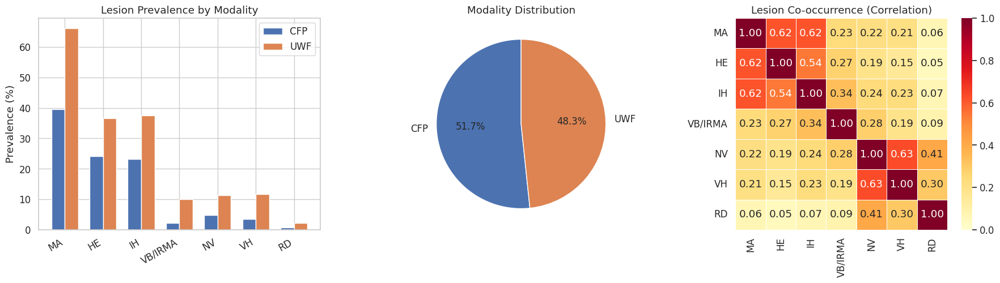

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='whitegrid', font_scale=1.1)
COLORS = sns.color_palette('Set2', 7)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Bar chart: lesion frequencies ──
ax = axes[0]
x = np.arange(7)
cfp_pcts = [cfp_labels[cfp_bn.str.startswith('tr').values, i].mean()*100 for i in range(7)]
uwf_pcts = [uwf_labels[uwf_bn.str.startswith('tr').values, i].mean()*100 for i in range(7)]
w = 0.35
ax.bar(x - w/2, cfp_pcts, w, label='CFP', color='#4C72B0', edgecolor='white')
ax.bar(x + w/2, uwf_pcts, w, label='UWF', color='#DD8452', edgecolor='white')
ax.set_xticks(x)
ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
ax.set_ylabel('Prevalence (%)')
ax.set_title('Lesion Prevalence by Modality')
ax.legend()

# ── Pie chart: modality distribution ──
ax = axes[1]
sizes = [len(cfp_df), len(uwf_df)]
ax.pie(sizes, labels=['CFP', 'UWF'], autopct='%1.1f%%',
       colors=['#4C72B0', '#DD8452'], startangle=90,
       textprops={'fontsize': 12})
ax.set_title('Modality Distribution')

# ── Heatmap: co-occurrence ──
ax = axes[2]
all_labels = np.vstack([cfp_labels, uwf_labels])
cooc = np.corrcoef(all_labels.T)
sns.heatmap(cooc, ax=ax, xticklabels=LESION_DISPLAY, yticklabels=LESION_DISPLAY,
            annot=True, fmt='.2f', cmap='YlOrRd', vmin=0, vmax=1,
            square=True, linewidths=0.5)
ax.set_title('Lesion Co-occurrence (Correlation)')

plt.tight_layout()
plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / 'dataset_overview.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 4 — Sample Visualization

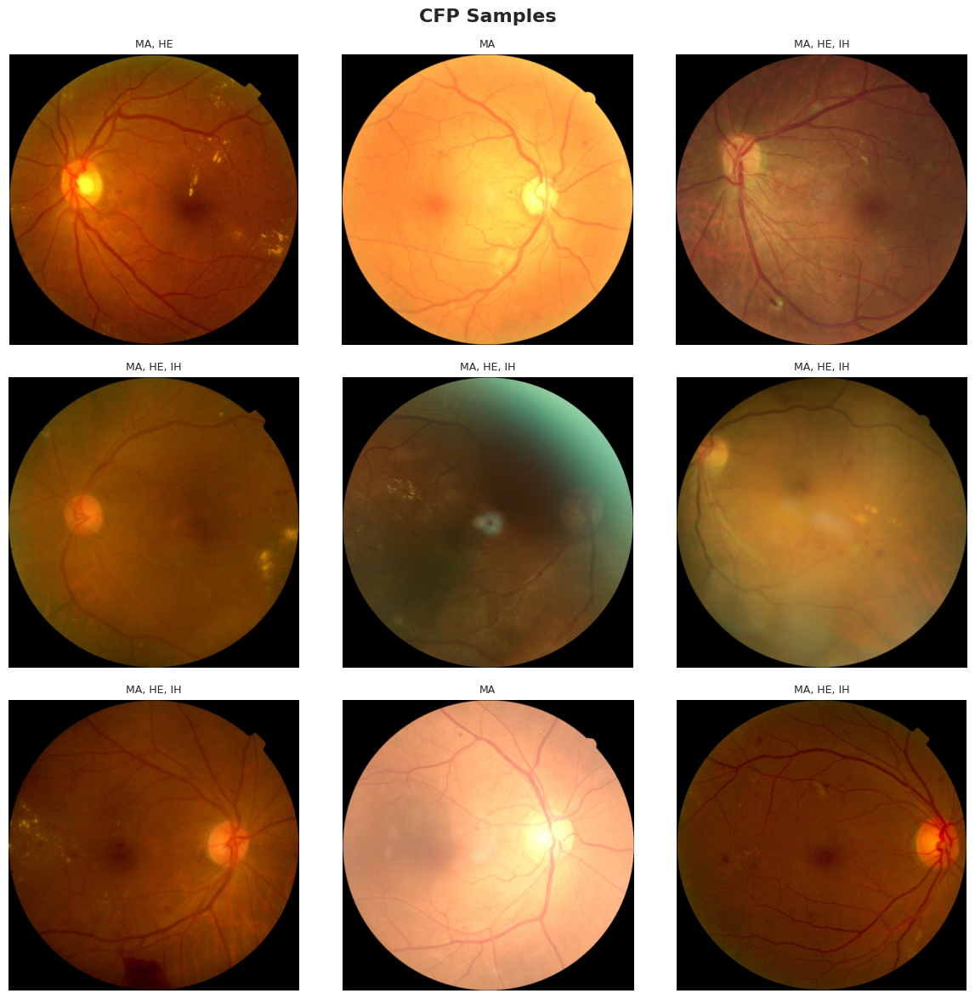

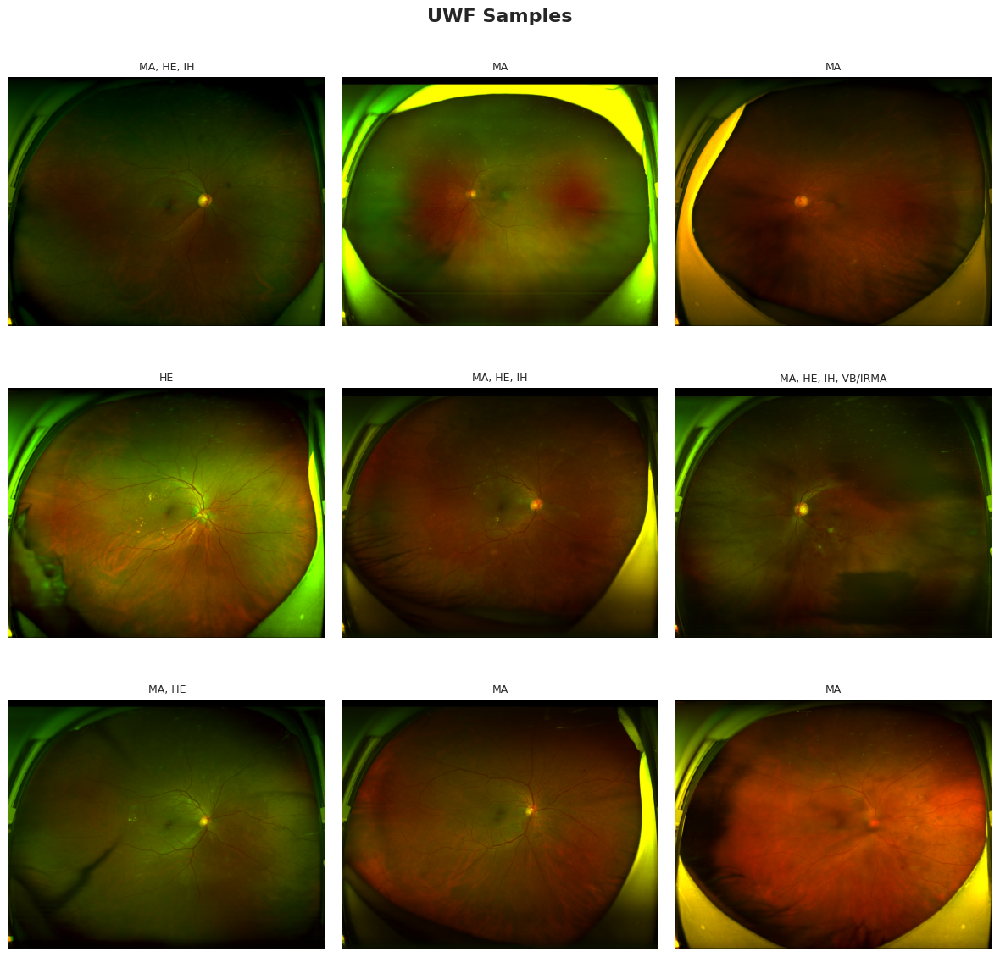

In [8]:
from PIL import Image
import random

random.seed(42)

def show_samples(df, img_root, modality, n=9):
    """Display a grid of retinal images with their lesion labels."""
    # Pick samples with at least one lesion
    labels_arr = parse_labels(df)
    has_lesion = labels_arr.sum(axis=1) > 0
    candidates = df.index[has_lesion].tolist()
    chosen = random.sample(candidates, min(n, len(candidates)))

    cols = 3
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    fig.suptitle(f'{modality} Samples', fontsize=16, fontweight='bold')

    for idx, ax in enumerate(axes.flat):
        if idx >= len(chosen):
            ax.axis('off'); continue
        row = df.iloc[chosen[idx]]
        img = Image.open(img_root / str(row['image'])).convert('RGB')
        lbl = ast.literal_eval(str(row['lesion']))
        present = [LESION_DISPLAY[i] for i, v in enumerate(lbl) if v == 1]
        ax.imshow(img)
        ax.set_title(', '.join(present) if present else 'No Lesion', fontsize=9)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_samples(cfp_df, DATA_DIR / 'MMRDR-CFP', 'CFP', n=9)
show_samples(uwf_df, DATA_DIR / 'MMRDR-UWF', 'UWF', n=9)


---
## Section 5 — Model Construction

In [9]:
from src.config import get_config
from src.model import Q2LLesionModel
from src.losses import AsymmetricLoss

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Backbone weights path (local) ──
# RETFound-MEH checkpoint (ViT-Large/16, MAE-pretrained on MEH-MIDAS).
BACKBONE_WEIGHTS = None

# Search for RETFound weights in known locations
_search_dirs = [
    pathlib.Path(PROJECT_ROOT) / 'weights',
    pathlib.Path(PROJECT_ROOT),
]
for _sd in _search_dirs:
    _candidates = list(_sd.glob('RETFound*.pth')) if _sd.exists() else []
    if _candidates:
        print(f'Found {len(_candidates)} candidate(s) in {_sd}:')
        for c in _candidates:
            print(f'    {c}')
        BACKBONE_WEIGHTS = str(_candidates[0])
        break

if BACKBONE_WEIGHTS is None:
    raise FileNotFoundError(
        'No RETFound*.pth found. Place the RETFound-MEH weights file '
        'in RETFound_Q2L/weights/ (e.g., weights/RETFound_mae_meh.pth).'
    )

print(f'\nUsing backbone weights: {BACKBONE_WEIGHTS}')
print(f'File: {pathlib.Path(BACKBONE_WEIGHTS).name}')

# ── Build model (using Exp C config as reference) ──
cfg = get_config('c', project_root=PROJECT_ROOT)
model = Q2LLesionModel(cfg, weights_path=BACKBONE_WEIGHTS).to(DEVICE)

_lr = model.backbone.load_report
assert _lr is not None and _lr['success'], (
    'model.backbone.load_report indicates the RETFound checkpoint did '
    'NOT load cleanly -- see the full report printed above.'
)
print(f'\n\u2705 CONFIRMED: RETFound-MEH pretrained weights loaded from '
      f'{_lr["checkpoint_filename"]} \u2014 {_lr["matched"]}/{_lr["target_total_keys"]} '
      f'backbone parameters initialized from pretrained weights, '
      f'0 missing. Model is NOT training from random initialization.')

summary = model.param_summary()
print(f'\nBackbone: RETFound (ViT-Large/16, MAE-pretrained)')
print(f'  Total params:     {summary["backbone_total"]:>12,}')
print(f'  Trainable params: {summary["backbone_trainable"]:>12,}')
print(f'  Frozen params:    {summary["backbone_total"] - summary["backbone_trainable"]:>12,}')
print(f'\nDecoder: Q2L (d=1024, 1enc+2dec, 4 heads)')
print(f'  Total params:     {summary["decoder_total"]:>12,}')
print(f'  Trainable params: {summary["decoder_trainable"]:>12,}')
print(f'\nFull model:')
print(f'  Total params:     {summary["total"]:>12,}')
print(f'  Trainable params: {summary["trainable"]:>12,}')

# ── Loss ──
criterion = AsymmetricLoss(gamma_pos=cfg.asl_gamma_pos, gamma_neg=cfg.asl_gamma_neg, clip=cfg.asl_clip)
print(f'\nLoss: ASL (gamma_pos={cfg.asl_gamma_pos}, gamma_neg={cfg.asl_gamma_neg}, clip={cfg.asl_clip})')


Found 1 candidate(s) in /home/user2/mydisk/sanchit/weights:
    /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth

Using backbone weights: /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth
File: RETFound_mae_meh.pth


/home/user2/mydisk/sanchit/src/backbone.py:222: RuntimeWarning: torch.load(weights_only=True) failed on '/home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth' (UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL argparse.Namespace was not an allowed global by default. Please use `torch.serialization.add_safe_globals([argparse.Namespace])` or the `torch.serialization.safe_globals([argparse.Namespace])` c

RETFound-MEH checkpoint load report
  Checkpoint path      : /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth
  Checkpoint filename  : RETFound_mae_meh.pth
  Checkpoint keys      : 398
  Target model keys    : 294
  Matched (loaded)     : 294/294 (pos_embed interpolated 14x14->32x32)
  Missing (NOT loaded) : 0  (none — every backbone parameter received pretrained weights)
  Unexpected, expected (MAE decoder/mask_token, safely ignored): 104
  Unexpected, UNRECOGNIZED (potential real mismatch)          : 0
  ✅ RETFound-MEH checkpoint loaded successfully — 294/294 backbone parameters initialized from pretrained weights. Model is NOT training from random initialization.


/home/user2/miniconda/envs/gpu-env/lib/python3.10/site-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(



✅ CONFIRMED: RETFound-MEH pretrained weights loaded from RETFound_mae_meh.pth — 294/294 backbone parameters initialized from pretrained weights, 0 missing. Model is NOT training from random initialization.

Backbone: RETFound (ViT-Large/16, MAE-pretrained)
  Total params:      304,149,504
  Trainable params:  304,149,504
  Frozen params:               0

Decoder: Q2L (d=1024, 1enc+2dec, 4 heads)
  Total params:       46,205,959
  Trainable params:   46,205,959

Full model:
  Total params:      350,355,463
  Trainable params:  350,355,463

Loss: ASL (gamma_pos=0.0, gamma_neg=6.0, clip=0.1)


---
## Section 6 — Forward Pass Validation

In [10]:
# ── Verify all tensor shapes through the pipeline ──
# Using B=2 for T4 GPU (16GB VRAM) to avoid OOM
model.eval()
B = 2  # Reduced for T4 GPU
dummy_img = torch.randn(B, 3, 512, 512, device=DEVICE)
dummy_mod = torch.tensor([0, 1], device=DEVICE)
dummy_lbl = torch.randint(0, 2, (B, 7), device=DEVICE).float()

with torch.no_grad(), torch.amp.autocast(device_type='cuda', enabled=cfg.use_amp):
    # Step-by-step
    features = model.backbone(dummy_img)
    print(f"Input image:        {dummy_img.shape}")
    print(f"Backbone output:    {features.shape}  (expected: [{B}, 1024, 32, 32])")
    
    logits = model.decoder(features, dummy_mod)
    print(f"Decoder output:     {logits.shape}  (expected: [{B}, 7])")
    
    probs = torch.sigmoid(logits)
    print(f"Probabilities:      {probs.shape}")
    print(f"  Sample probs:     {probs[0].cpu().numpy().round(3)}")
    
    loss = criterion(logits, dummy_lbl)
    print(f"\nASL loss:           {loss.item():.4f}")

assert features.shape == (B, 1024, 32, 32), "Backbone shape mismatch!"
assert logits.shape == (B, 7), "Decoder shape mismatch!"
print("\nAll shapes verified.")

# Report GPU memory usage on T4
if torch.cuda.is_available():
    allocated = torch.cuda.memory_allocated() / 1e9
    reserved = torch.cuda.memory_reserved() / 1e9
    print(f"\nT4 GPU Memory: {allocated:.2f} GB allocated, {reserved:.2f} GB reserved / 16 GB total")

del model, features, logits, dummy_img  # free memory
torch.cuda.empty_cache()


Input image:        torch.Size([2, 3, 512, 512])
Backbone output:    torch.Size([2, 1024, 32, 32])  (expected: [2, 1024, 32, 32])
Decoder output:     torch.Size([2, 7])  (expected: [2, 7])
Probabilities:      torch.Size([2, 7])
  Sample probs:     [0.332 0.622 0.425 0.495 0.39  0.576 0.461]

ASL loss:           0.3920

All shapes verified.

T4 GPU Memory: 1.44 GB allocated, 2.23 GB reserved / 16 GB total


---
## Section 7 — Experiment Launcher

Run experiments in order: **A** (CFP) -> **B** (UWF) -> **C** (Joint) -> decision gate -> **D** (CMQC).

Each cell calls `train.py` which handles the full training + threshold optimization pipeline.

In [11]:
# ── Verify Checkpoint Status ─────────────────────────────────────────────────
# On Kaggle, this cell restored outputs from a Kaggle dataset.
# Locally, checkpoints should already be in outputs/

import pathlib

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
_exps = [
    ('exp_a_cfp', 'A: CFP-only'),
    ('exp_b_uwf', 'B: UWF-only'),
    ('exp_c_joint', 'C: Joint'),
    ('exp_d_cmqc', 'D: CMQC'),
]

print('Checkpoint status:')
for exp_name, label in _exps:
    d = _output_root / exp_name
    if not d.exists():
        print(f'  {label}: not started')
        continue
    files = [f.name for f in d.iterdir() if f.is_file()]
    pth_files = [f for f in files if f.endswith('.pth')]
    json_files = [f for f in files if f.endswith('.json')]
    has_results = 'results.json' in files
    has_best = 'best_model.pth' in files
    has_last = 'last_model.pth' in files
    if has_best and has_results:
        status = '\u2713 Complete'
    elif has_last:
        status = '\u21a9 Resumable (last_model.pth)'
    elif has_best:
        status = '\u26a0 Has best_model but no results'
    else:
        status = '\u25cb Partial'
    print(f'  {label}: {status}')
    for f in sorted(pth_files):
        sz = (d / f).stat().st_size / 1e6
        print(f'    {f} ({sz:.0f} MB)')
    for f in sorted(json_files):
        print(f'    {f}')


Checkpoint status:
  A: CFP-only: ✓ Complete
    best_model.pth (2837 MB)
    config.json
    history.json
    results.json
    thresholds.json
  B: UWF-only: ✓ Complete
    best_model.pth (2837 MB)
    last_model.pth (5640 MB)
    config.json
    history.json
    results.json
    thresholds.json
  C: Joint: ✓ Complete
    best_model.pth (2837 MB)
    last_model.pth (5640 MB)
    config.json
    history.json
    results.json
    thresholds.json
  D: CMQC: ✓ Complete
    best_model.pth (2837 MB)
    last_model.pth (5640 MB)
    config.json
    history.json
    results.json
    thresholds.json


In [12]:
# ── Experiment Launcher (Local / Windows-compatible) ─────────────────────────
#
# Features:
#   - Sequential or parallel execution (dual-GPU)
#   - Per-experiment batch_size override via --batch-size
#   - Resume detection from last_model.pth / mid_epoch.pth
#   - Resource monitoring (GPU, RAM, RSS)
#
# GPU strategy:
#   PARALLEL_DUAL_GPU = True  → runs 2 experiments simultaneously
#     on separate GPUs (CUDA_VISIBLE_DEVICES=0 and =1)
#   PARALLEL_DUAL_GPU = False → runs 1 experiment at a time on GPU 0

import pathlib, os, json as _json, subprocess, sys, time, gc
import torch as _torch

try:
    import psutil
    _HAVE_PSUTIL = True
except ImportError:
    _HAVE_PSUTIL = False
    print('\u26a0 psutil not available \u2014 install with: pip install psutil')

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
_BB = ['--backbone-weights', BACKBONE_WEIGHTS] if BACKBONE_WEIGHTS else []

# Absolute script paths (never rely on the subprocess's cwd to find these)
TRAIN_SCRIPT = str(pathlib.Path(PROJECT_ROOT) / 'train.py')
EVALUATE_SCRIPT = str(pathlib.Path(PROJECT_ROOT) / 'evaluate.py')  # not launched as a subprocess in this notebook (evaluation cells import src.* in-process) — kept for parity/future use
assert pathlib.Path(TRAIN_SCRIPT).exists(), f'train.py not found at {TRAIN_SCRIPT}'
assert pathlib.Path(EVALUATE_SCRIPT).exists(), f'evaluate.py not found at {EVALUATE_SCRIPT}'

# \u2500\u2500 Configuration \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
CONTINUE_ON_FAILURE = False
PARALLEL_DUAL_GPU  = False  # Set True after first successful sequential run

# Per-experiment overrides (batch_size, num_workers).
# Exp B keeps batch_size=8 to match the Kaggle checkpoint it resumes from.
# Exp C/D use batch_size=16 for faster training on local hardware.
EXP_OVERRIDES = {
    'a': {},                                  # complete, will be skipped
    'b': {},                                  # resume: uses config default (8)
    'c': {'batch_size': 16, 'grad_accum_steps': 1},  # fresh: effective=16 (16*1)
    'd': {'batch_size': 16, 'grad_accum_steps': 1},  # fresh: effective=16 (16*1)
}


def _gpu_all_stats():
    """Per-GPU stats via nvidia-smi."""
    try:
        out = subprocess.check_output(
            ['nvidia-smi',
             '--query-gpu=index,memory.used,memory.total,utilization.gpu',
             '--format=csv,noheader,nounits'],
            text=True, timeout=10,
        ).strip().splitlines()
        stats = []
        for line in out:
            idx, used, total, util = (x.strip() for x in line.split(','))
            stats.append((int(idx), int(used), int(total), int(util)))
        return stats
    except Exception:
        return []


def _num_gpus():
    """Count available GPUs."""
    return len(_gpu_all_stats())


def _print_resource_snapshot(label=''):
    gpu_all = _gpu_all_stats()
    tag = f' [{label}]' if label else ''
    print(f'  --- resource snapshot{tag} ---')
    if gpu_all:
        for idx, used, total, util in gpu_all:
            print(f'    GPU{idx}: {used/1024:.2f} GB / {total/1024:.2f} GB ({util}% util)')
    if _HAVE_PSUTIL:
        vm = psutil.virtual_memory()
        print(f'    RAM: {vm.used/1e9:.2f} GB / {vm.total/1e9:.2f} GB')
        try:
            print(f'    Process RSS: {psutil.Process(os.getpid()).memory_info().rss/1e9:.2f} GB')
        except Exception:
            pass


def _is_done(exp_name):
    d = _output_root / exp_name
    return (d / 'best_model.pth').exists() and (d / 'results.json').exists()


def _resume_ckpt(exp_name):
    """Find best resume checkpoint. train.py also does its own detection."""
    d = _output_root / exp_name
    last_p = d / 'last_model.pth'
    mid_p = d / 'mid_epoch.pth'
    if mid_p.exists() and last_p.exists():
        try:
            last_epoch = _torch.load(last_p, map_location='cpu', weights_only=False).get('epoch', -1)
            mid_epoch = _torch.load(mid_p, map_location='cpu', weights_only=False).get('epoch', -1)
            return str(mid_p) if mid_epoch >= last_epoch else str(last_p)
        except Exception:
            return str(last_p)
    if mid_p.exists():
        return str(mid_p)
    if last_p.exists():
        return str(last_p)
    return None


def _build_args(letter, gpu_id=0):
    """Build the train.py command-line arguments for an experiment."""
    exp_name = {'a': 'exp_a_cfp', 'b': 'exp_b_uwf',
                'c': 'exp_c_joint', 'd': 'exp_d_cmqc'}[letter]

    args = [sys.executable, '-u', TRAIN_SCRIPT, '--experiment', letter,
            '--project-root', PROJECT_ROOT] + _BB

    # Per-experiment overrides
    overrides = EXP_OVERRIDES.get(letter, {})
    if 'batch_size' in overrides:
        args += ['--batch-size', str(overrides['batch_size'])]
    if 'num_workers' in overrides:
        args += ['--num-workers', str(overrides['num_workers'])]
    if 'grad_accum_steps' in overrides:
        args += ['--grad-accum-steps', str(overrides['grad_accum_steps'])]

    # Resume checkpoint
    resume_path = _resume_ckpt(exp_name)
    if resume_path:
        args += ['--resume', resume_path]

    env = dict(os.environ)
    env['PYTHONUNBUFFERED'] = '1'
    env['CUDA_VISIBLE_DEVICES'] = str(gpu_id)

    return args, env, resume_path


def run_experiment(letter, exp_name, label, gpu_id=0):
    """Run a single experiment on the specified GPU. Blocks until done."""
    print()
    print('=' * 60)
    print(f'  EXPERIMENT {letter.upper()} \u2014 {label}  [GPU {gpu_id}]')
    print('=' * 60)
    sys.stdout.flush()

    if _is_done(exp_name):
        try:
            res = _json.loads((_output_root / exp_name / 'results.json').read_text())
            mods = list(res.keys())
            f1 = res[mods[0]].get('metrics_at_optimized', {}).get('macro_f1', '?')
            print(f'  \u2713 Already complete \u2014 Macro F1 (test): {f1}')
        except Exception:
            print('  \u2713 Already complete.')
        return True

    _print_resource_snapshot(label=f'{exp_name} pre-launch')

    args, env, resume_path = _build_args(letter, gpu_id)
    overrides = EXP_OVERRIDES.get(letter, {})

    if resume_path:
        try:
            ck = _torch.load(resume_path, map_location='cpu', weights_only=False)
            print(f'  \u21a9  Resuming from epoch {ck.get("epoch","?")}  '
                  f'(best val F1: {ck.get("best_val_f1","?")})')
        except Exception as e:
            print(f'  \u21a9  Resuming (could not read epoch: {e})')
    else:
        print('  \u25b6  Starting fresh')

    if overrides:
        print(f'  Overrides: {overrides}')
    print(f'  GPU: {gpu_id}')
    print(f'  CMD: {" ".join(args)}')
    sys.stdout.flush()

    t0 = time.time()

    proc = subprocess.Popen(
        args,
        cwd=PROJECT_ROOT,
        env=env,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
        bufsize=1,
    )

    # Stream output line by line
    for line in proc.stdout:
        print(f'  [{letter.upper()}] {line}', end='')
        sys.stdout.flush()

    ret = proc.wait()
    elapsed = time.time() - t0

    success = False
    if _is_done(exp_name):
        print(f'\n  \u2713 Experiment {letter.upper()} COMPLETE  ({elapsed:.0f}s)')
        success = True
    elif ret == 0:
        print(f'\n  \u23f8  Experiment {letter.upper()} exited 0 without completing '
              f'({elapsed:.0f}s) \u2014 will auto-resume on next run.')
    else:
        print(f'\n  \u2717 Experiment {letter.upper()} exited with code {ret}  ({elapsed:.0f}s)')
        crash_log = _output_root / 'CRASH.log'
        if crash_log.exists():
            print('  --- CRASH.log (tail) ---')
            print('\n'.join(crash_log.read_text().splitlines()[-30:]))
        train_log = _output_root / exp_name / 'train.log'
        if train_log.exists():
            print('  --- train.log (tail) ---')
            print('\n'.join(train_log.read_text().splitlines()[-30:]))

    gc.collect()
    if _torch.cuda.is_available():
        _torch.cuda.empty_cache()

    _print_resource_snapshot(label=f'{exp_name} post-run')
    return success


def _run_pair_parallel(exp1, exp2):
    """Run two experiments in parallel on GPU 0 and GPU 1.
    Streams output from both, prefixed with experiment letter.
    """
    letter1, name1, label1 = exp1
    letter2, name2, label2 = exp2

    # Check if either is already done
    done1 = _is_done(name1)
    done2 = _is_done(name2)

    if done1 and done2:
        run_experiment(letter1, name1, label1, gpu_id=0)
        run_experiment(letter2, name2, label2, gpu_id=1)
        return True, True

    if done1:
        run_experiment(letter1, name1, label1, gpu_id=0)
        ok2 = run_experiment(letter2, name2, label2, gpu_id=1)
        return True, ok2

    if done2:
        ok1 = run_experiment(letter1, name1, label1, gpu_id=0)
        run_experiment(letter2, name2, label2, gpu_id=1)
        return ok1, True

    # Both need to run \u2014 launch in parallel
    print()
    print('=' * 60)
    print(f'  PARALLEL: {letter1.upper()} (GPU 0) + {letter2.upper()} (GPU 1)')
    print('=' * 60)
    _print_resource_snapshot(label='pre-parallel')

    args1, env1, res1 = _build_args(letter1, gpu_id=0)
    args2, env2, res2 = _build_args(letter2, gpu_id=1)

    overrides1 = EXP_OVERRIDES.get(letter1, {})
    overrides2 = EXP_OVERRIDES.get(letter2, {})
    print(f'  {letter1.upper()}: resume={"yes" if res1 else "no"}, overrides={overrides1}')
    print(f'  {letter2.upper()}: resume={"yes" if res2 else "no"}, overrides={overrides2}')
    print(f'  CMD1: {" ".join(args1)}')
    print(f'  CMD2: {" ".join(args2)}')
    sys.stdout.flush()

    t0 = time.time()

    proc1 = subprocess.Popen(
        args1, cwd=PROJECT_ROOT, env=env1,
        stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
        text=True, bufsize=1,
    )
    proc2 = subprocess.Popen(
        args2, cwd=PROJECT_ROOT, env=env2,
        stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
        text=True, bufsize=1,
    )

    import threading, queue

    output_q = queue.Queue()

    def _reader(proc, tag):
        for line in proc.stdout:
            output_q.put(f'  [{tag}] {line}')
        output_q.put(None)  # sentinel

    t1 = threading.Thread(target=_reader, args=(proc1, letter1.upper()), daemon=True)
    t2 = threading.Thread(target=_reader, args=(proc2, letter2.upper()), daemon=True)
    t1.start()
    t2.start()

    # Print interleaved output from both processes
    done_count = 0
    while done_count < 2:
        try:
            item = output_q.get(timeout=60)
            if item is None:
                done_count += 1
            else:
                print(item, end='')
                sys.stdout.flush()
        except queue.Empty:
            pass  # heartbeat timeout, continue

    ret1 = proc1.wait()
    ret2 = proc2.wait()
    elapsed = time.time() - t0

    ok1 = _is_done(name1)
    ok2 = _is_done(name2)

    print(f'\n  Parallel run complete ({elapsed:.0f}s):')
    status1 = "✓ COMPLETE" if ok1 else f"exit {ret1}"
    print(f"    {letter1.upper()}: {status1}")
    status2 = "✓ COMPLETE" if ok2 else f"exit {ret2}"
    print(f"    {letter2.upper()}: {status2}")

    gc.collect()
    if _torch.cuda.is_available():
        _torch.cuda.empty_cache()

    _print_resource_snapshot(label='post-parallel')
    return ok1, ok2


# \u2500\u2500 Execution strategy \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
# Sequential order: A \u2192 B \u2192 C \u2192 D
#
# With PARALLEL_DUAL_GPU=True and 2 GPUs available:
#   Round 1: A (GPU 0) + B (GPU 1)  \u2014 in parallel
#   Round 2: C (GPU 0) + D (GPU 1)  \u2014 in parallel
# This respects the dependency: C/D can start before A/B finish because
# they are independent experiments (no weight sharing between experiments).
#
# With PARALLEL_DUAL_GPU=False (or only 1 GPU): A \u2192 B \u2192 C \u2192 D sequential.

_experiments = [
    ('a', 'exp_a_cfp',   'CFP-only baseline'),
    ('b', 'exp_b_uwf',   'UWF-only baseline'),
    ('c', 'exp_c_joint', 'Joint CFP+UWF'),
    ('d', 'exp_d_cmqc',  'Joint CFP+UWF + CMQC'),
]

n_gpus = _num_gpus()
use_parallel = PARALLEL_DUAL_GPU and n_gpus >= 2

if use_parallel:
    print(f'\u2713 Dual-GPU mode: {n_gpus} GPUs detected, running pairs in parallel')
    # Round 1: A + B
    ok_a, ok_b = _run_pair_parallel(_experiments[0], _experiments[1])
    if not ok_a and not CONTINUE_ON_FAILURE:
        print('\n\u2717 Stopping: Experiment A failed.')
    elif not ok_b and not CONTINUE_ON_FAILURE:
        print('\n\u2717 Stopping: Experiment B failed.')
    else:
        # Round 2: C + D
        ok_c, ok_d = _run_pair_parallel(_experiments[2], _experiments[3])
else:
    if n_gpus < 2:
        print(f'Single-GPU mode ({n_gpus} GPU detected)')
    else:
        print(f'Sequential mode (PARALLEL_DUAL_GPU=False, {n_gpus} GPUs available)')

    for _letter, _exp_name, _label in _experiments:
        _ok = run_experiment(_letter, _exp_name, _label, gpu_id=3)
        if not _ok and not CONTINUE_ON_FAILURE:
            print(f'\n\u2717 Stopping: Experiment {_letter.upper()} failed.')
            break

print()
print('=' * 60)
print('  ALL EXPERIMENTS DONE')
print('=' * 60)


Sequential mode (PARALLEL_DUAL_GPU=False, 4 GPUs available)

  EXPERIMENT A — CFP-only baseline  [GPU 3]
  ✓ Already complete — Macro F1 (test): 0.6843

  EXPERIMENT B — UWF-only baseline  [GPU 3]
  ✓ Already complete — Macro F1 (test): 0.7717

  EXPERIMENT C — Joint CFP+UWF  [GPU 3]
  ✓ Already complete — Macro F1 (test): 0.6876

  EXPERIMENT D — Joint CFP+UWF + CMQC  [GPU 3]
  ✓ Already complete — Macro F1 (test): 0.6702

  ALL EXPERIMENTS DONE


In [13]:
# ── Experiment Progress & Resume Status ──────────────────────────────────────
# Run at any time to check which experiments are done / resumable.

import pathlib, json as _json, torch as _torch

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
_exps = [
    ('exp_a_cfp',   'A: CFP-only'),
    ('exp_b_uwf',   'B: UWF-only'),
    ('exp_c_joint', 'C: Joint CFP+UWF'),
    ('exp_d_cmqc',  'D: CMQC'),
]

print('Experiment Status')
print('\u2500' * 72)
print(f'  {"Experiment":<22} {"Status":<22} {"Best F1":>8}  Resume from')
print('\u2500' * 72)

for exp_name, label in _exps:
    d = _output_root / exp_name
    has_best   = (d / 'best_model.pth').exists()
    has_result = (d / 'results.json').exists()
    last_ckpt  = d / 'last_model.pth'

    if has_best and has_result:
        try:
            res  = _json.loads((d / 'results.json').read_text())
            mods = list(res.keys())
            f1   = res[mods[0]].get('metrics_at_optimized', {}).get('macro_f1', None)
            f1_s = f'{f1:.4f}' if f1 else '\u2014'
        except Exception:
            f1_s = '\u2014'
        status   = '\u2713 Complete'
        resume_s = '\u2014'
    elif last_ckpt.exists():
        try:
            ck       = _torch.load(str(last_ckpt), map_location='cpu', weights_only=False)
            ep       = ck.get('epoch', '?')
            best_f1v = ck.get('best_val_f1', 0.0)
            status   = f'\u21a9  Interrupted ep {ep}'
            f1_s     = f'{best_f1v:.4f}' if best_f1v else '\u2014'
        except Exception:
            status   = '\u21a9  last_model.pth found'
            f1_s     = '\u2014'
        resume_s = 'last_model.pth'
    elif d.exists() and any(d.iterdir()):
        status   = '\u26a0  Partial (no ckpt)'
        f1_s     = '\u2014'
        resume_s = '\u2014'
    else:
        status   = '\u25cb  Not started'
        f1_s     = '\u2014'
        resume_s = '\u2014'

    print(f'  {label:<22} {status:<22} {f1_s:>8}  {resume_s}')

print('\u2500' * 72)

# Show checkpoint sizes
ckpt_files = list(_output_root.rglob('*.pth')) if _output_root.exists() else []
if ckpt_files:
    _total_mb = sum(p.stat().st_size for p in ckpt_files) / 1e6
    print(f'\nCheckpoint files: {_total_mb:.0f} MB total')
    for _p in sorted(ckpt_files):
        _sz = _p.stat().st_size / 1e6
        _tag = '  \u2190 intermediate' if 'epoch' in _p.name or _p.name == 'last_model.pth' else ''
        print(f'  {_p.relative_to(_output_root)}  ({_sz:.0f} MB){_tag}')

print('\nTo resume interrupted experiments:')
print('  Re-run the Experiment Launcher cell above \u2014 it auto-detects checkpoints.')


Experiment Status
────────────────────────────────────────────────────────────────────────
  Experiment             Status                  Best F1  Resume from
────────────────────────────────────────────────────────────────────────
  A: CFP-only            ✓ Complete               0.6843  —
  B: UWF-only            ✓ Complete               0.7717  —
  C: Joint CFP+UWF       ✓ Complete               0.6876  —
  D: CMQC                ✓ Complete               0.6702  —
────────────────────────────────────────────────────────────────────────

Checkpoint files: 28267 MB total
  exp_a_cfp/best_model.pth  (2837 MB)
  exp_b_uwf/best_model.pth  (2837 MB)
  exp_b_uwf/last_model.pth  (5640 MB)  ← intermediate
  exp_c_joint/best_model.pth  (2837 MB)
  exp_c_joint/last_model.pth  (5640 MB)  ← intermediate
  exp_d_cmqc/best_model.pth  (2837 MB)
  exp_d_cmqc/last_model.pth  (5640 MB)  ← intermediate

To resume interrupted experiments:
  Re-run the Experiment Launcher cell above — it auto-detects c

In [14]:
# ── Decision Gate: Is joint training beneficial? ──
import json

def load_results(exp_name):
    p = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_name / 'results.json'
    if not p.exists():
        print(f"  {exp_name}: not yet run"); return None
    with open(p) as f: return json.load(f)

res_a = load_results('exp_a_cfp')
res_b = load_results('exp_b_uwf')
res_c = load_results('exp_c_joint')

if all([res_a, res_b, res_c]):
    f1_a = res_a.get('cfp', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_b = res_b.get('uwf', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_c_cfp = res_c.get('cfp', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_c_uwf = res_c.get('uwf', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    
    print('=== Decision Gate ===')
    print(f'  Exp A (CFP-only):  CFP F1 = {f1_a:.4f}')
    print(f'  Exp B (UWF-only):  UWF F1 = {f1_b:.4f}')
    print(f'  Exp C (Joint):     CFP F1 = {f1_c_cfp:.4f}  UWF F1 = {f1_c_uwf:.4f}')
    print()
    cfp_pass = f1_c_cfp >= f1_a
    uwf_pass = f1_c_uwf >= f1_b
    print(f'  CFP: Joint {">=" if cfp_pass else "<"} Separate  ({"PASS" if cfp_pass else "FAIL"})')
    print(f'  UWF: Joint {">=" if uwf_pass else "<"} Separate  ({"PASS" if uwf_pass else "FAIL"})')
    print(f'\n  Proceed to Exp D: {"YES" if (cfp_pass and uwf_pass) else "INVESTIGATE FIRST"}')
else:
    print('Run experiments A, B, C first.')

=== Decision Gate ===
  Exp A (CFP-only):  CFP F1 = 0.6843
  Exp B (UWF-only):  UWF F1 = 0.7717
  Exp C (Joint):     CFP F1 = 0.6876  UWF F1 = 0.7704

  CFP: Joint >= Separate  (PASS)
  UWF: Joint < Separate  (FAIL)

  Proceed to Exp D: INVESTIGATE FIRST


In [15]:
# ── Checkpoint Cleanup ───────────────────────────────────────────────────────
# Remove intermediate checkpoints to reclaim disk space.
# Keeps best_model.pth, results.json, thresholds.json, config.json, history.json

import pathlib, os, glob

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'

removed_mb = 0.0
for exp_dir in sorted(_output_root.iterdir()):
    if not exp_dir.is_dir():
        continue
    for pattern in ['checkpoint_epoch_*.pth', 'last_model.pth', 'mid_epoch.pth']:
        for ck in glob.glob(str(exp_dir / pattern)):
            sz = os.path.getsize(ck) / 1e6
            # Uncomment the next line to actually delete:
            # os.remove(ck)
            print(f'  Would remove: {os.path.basename(ck)}  ({sz:.0f} MB)')
            removed_mb += sz

if removed_mb:
    print(f'\n  Total reclaimable: {removed_mb:.0f} MB')
    print('  Uncomment os.remove() lines above to actually delete.')
else:
    print('  No intermediate checkpoints found.')


  Would remove: last_model.pth  (5640 MB)
  Would remove: last_model.pth  (5640 MB)
  Would remove: last_model.pth  (5640 MB)

  Total reclaimable: 16920 MB
  Uncomment os.remove() lines above to actually delete.


---
## Section 8 — Training Monitoring

In [16]:
import re

def parse_train_log(exp_name):
    """Parse train.log into a DataFrame of per-epoch metrics."""
    log_path = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_name / 'train.log'
    if not log_path.exists(): return None
    
    epochs, losses, f1s = [], [], []
    per_class = {n: [] for n in ['MA','HE','IH','VB','NV','VH','RD']}
    lr_bbs, lr_decs = [], []
    
    pattern = re.compile(
        r'Ep\s+(\d+)/(\d+)\s+\|\s+loss=([\d.]+)\s+\|\s+.*?F1=([\d.]+)\s+\|\s+'
        r'MA=([\d.]+)\s+HE=([\d.]+)\s+IH=([\d.]+)\s+VB=([\d.]+)\s+'
        r'NV=([\d.]+)\s+VH=([\d.]+)\s+RD=([\d.]+)\s+\|\s+'
        r'lr_bb=([\d.e+-]+)\s+lr_dec=([\d.e+-]+)'
    )
    
    for line in log_path.read_text(encoding='utf-8').splitlines():
        m = pattern.search(line)
        if m:
            epochs.append(int(m.group(1)))
            losses.append(float(m.group(3)))
            f1s.append(float(m.group(4)))
            for i, n in enumerate(['MA','HE','IH','VB','NV','VH','RD']):
                per_class[n].append(float(m.group(5+i)))
            lr_bbs.append(float(m.group(12)))
            lr_decs.append(float(m.group(13)))
    
    if not epochs: return None
    df = pd.DataFrame({'epoch': epochs, 'loss': losses, 'macro_f1': f1s,
                       'lr_backbone': lr_bbs, 'lr_decoder': lr_decs, **per_class})
    return df


def plot_training(exp_names, titles):
    """Plot loss, F1, per-class F1, and LR curves for given experiments."""
    dfs = {n: parse_train_log(n) for n in exp_names}
    dfs = {k: v for k, v in dfs.items() if v is not None}
    if not dfs:
        print('No training logs found. Run experiments first.'); return
    
    n_exp = len(dfs)
    fig, axes = plt.subplots(3, n_exp, figsize=(6*n_exp, 12), squeeze=False)
    
    for col, (name, df) in enumerate(dfs.items()):
        title = titles.get(name, name)
        
        # Row 1: Loss
        ax = axes[0, col]
        ax.plot(df['epoch'], df['loss'], 'b-', linewidth=1.5)
        ax.set_xlabel('Epoch'); ax.set_ylabel('Train Loss')
        ax.set_title(f'{title} — Loss'); ax.grid(True, alpha=0.3)
        
        # Row 2: Macro F1 + per-class F1
        ax = axes[1, col]
        ax.plot(df['epoch'], df['macro_f1'], 'k-', linewidth=2, label='Macro')
        for i, n in enumerate(['MA','HE','IH','VB','NV','VH','RD']):
            ax.plot(df['epoch'], df[n], '--', color=COLORS[i], alpha=0.7, label=n)
        ax.set_xlabel('Epoch'); ax.set_ylabel('F1 Score')
        ax.set_title(f'{title} — F1'); ax.legend(fontsize=7, ncol=4)
        ax.grid(True, alpha=0.3); ax.set_ylim(0, 1)
        
        # Row 3: LR
        ax = axes[2, col]
        ax.plot(df['epoch'], df['lr_backbone'], 'b-', label='Backbone (1e-5)')
        ax.plot(df['epoch'], df['lr_decoder'], 'r-', label='Decoder (1e-4)')
        ax.set_xlabel('Epoch'); ax.set_ylabel('Learning Rate')
        ax.set_title(f'{title} — LR Schedule'); ax.legend()
        ax.set_yscale('log'); ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / 'training_curves.png'), dpi=100, bbox_inches='tight')
    plt.show()


plot_training(
    ['exp_a_cfp', 'exp_b_uwf', 'exp_c_joint', 'exp_d_cmqc'],
    {'exp_a_cfp': 'A: CFP', 'exp_b_uwf': 'B: UWF',
     'exp_c_joint': 'C: Joint', 'exp_d_cmqc': 'D: CMQC'}
)

No training logs found. Run experiments first.


--- 
## Section 9 — Threshold Optimization Visualization

**Consolidated:** this section now performs the single model load + val/test inference pass that feeds Sections 9, 11, 12, 13, 14, and 16. All downstream sections reuse the cached `PRED_CACHE` instead of reloading the model or re-running inference.

/home/user2/mydisk/sanchit/src/backbone.py:222: RuntimeWarning: torch.load(weights_only=True) failed on '/home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth' (UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL argparse.Namespace was not an allowed global by default. Please use `torch.serialization.add_safe_globals([argparse.Namespace])` or the `torch.serialization.safe_globals([argparse.Namespace])` c

RETFound-MEH checkpoint load report
  Checkpoint path      : /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth
  Checkpoint filename  : RETFound_mae_meh.pth
  Checkpoint keys      : 398
  Target model keys    : 294
  Matched (loaded)     : 294/294 (pos_embed interpolated 14x14->32x32)
  Missing (NOT loaded) : 0  (none — every backbone parameter received pretrained weights)
  Unexpected, expected (MAE decoder/mask_token, safely ignored): 104
  Unexpected, UNRECOGNIZED (potential real mismatch)          : 0
  ✅ RETFound-MEH checkpoint loaded successfully — 294/294 backbone parameters initialized from pretrained weights. Model is NOT training from random initialization.


/home/user2/miniconda/envs/gpu-env/lib/python3.10/site-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


Cached predictions for Exp C:
  Val:  2,086 samples
  Test (cfp): 2,225 samples
  Test (uwf): 2,597 samples
  Attention samples: {'cfp': 3, 'uwf': 3}


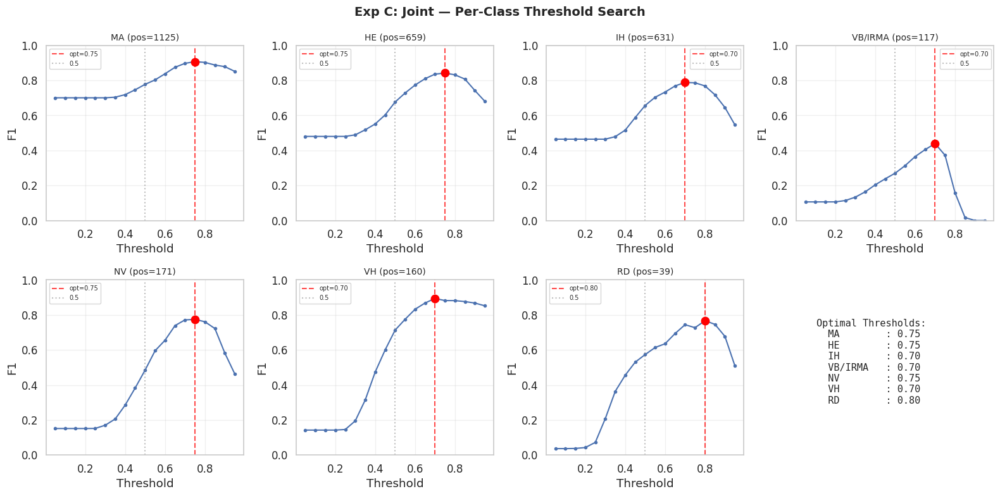

In [17]:
# Select which experiment to analyze (change to 'a', 'b', 'c', or 'd')
EXP_KEY = 'c'

from src.dataset import build_dataloaders
from src.threshold import _collect_predictions
from sklearn.metrics import f1_score as sk_f1
import contextlib
import torch.nn.functional as F

# ── Choose which experiment's checkpoint drives the analysis section ──
# Default to Exp C (joint naive merge). If Exp D was run and the final
# dashboard (Section 17) shows it wins, change this to 'd' and re-run
# this cell once — every downstream cell (Sections 9-16) will then use
# the cached predictions from that experiment automatically.
EXP_KEY = 'c'


def load_experiment_model(exp_key):
    """Build the model and load its best checkpoint. Returns (model, cfg) or (None, None)."""
    cfg_e = get_config(exp_key, project_root=PROJECT_ROOT)
    ckpt_path = cfg_e.output_dir / 'best_model.pth'
    if not ckpt_path.exists():
        return None, cfg_e
    mdl = Q2LLesionModel(cfg_e, weights_path=BACKBONE_WEIGHTS).to(DEVICE)
    ckpt = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    mdl.load_state_dict(ckpt.get('ema_state_dict', ckpt['model_state_dict']))
    mdl.eval()
    return mdl, cfg_e


@contextlib.contextmanager
def capture_cross_attention(decoder_module):
    """Temporarily hook cross-attention layers to capture weights.

    Uses forward hooks on nn.MultiheadAttention modules without
    modifying any source files.
    """
    attn_maps = {}
    hooks = []

    for i, layer in enumerate(decoder_module.decoder.layers):
        mha = layer.multihead_attn
        orig_forward = mha.forward

        def make_patched(idx, orig):
            def patched(*args, **kwargs):
                kwargs['need_weights'] = True
                kwargs['average_attn_weights'] = True
                out = orig(*args, **kwargs)
                attn_maps[f'decoder_layer_{idx}'] = out[1].detach().cpu()
                return out
            return patched

        mha.forward = make_patched(i, orig_forward)
        hooks.append((mha, orig_forward))

    try:
        yield attn_maps
    finally:
        for mha, orig in hooks:
            mha.forward = orig


# ── Single load / single pass: build a shared prediction cache ────────
# This replaces the per-cell model reloads + repeated full-dataset
# inference that used to happen independently in the threshold search,
# confusion matrix, ROC, PR, attention, and error-analysis cells.
PRED_CACHE = {}

_model, _cfg = load_experiment_model(EXP_KEY)

if _model is None:
    print(f"Experiment '{EXP_KEY}': no checkpoint found at "
          f"{_cfg.output_dir / 'best_model.pth'}. Run the corresponding "
          f"training cell first.")
else:
    thresh_path = _cfg.output_dir / 'thresholds.json'
    with open(thresh_path) as f:
        PRED_CACHE['thresholds'] = json.load(f)

    _, val_loader, test_loaders = build_dataloaders(_cfg)

    # Validation predictions — drives threshold-search curves (Section 9)
    val_probs, val_labels = _collect_predictions(_model, val_loader, DEVICE, _cfg.use_amp)
    PRED_CACHE['val'] = {'probs': val_probs, 'labels': val_labels}

    # Test predictions per modality — drives confusion/ROC/PR/error analysis
    # (Sections 11, 12, 13, 16). Each test set is traversed exactly once.
    PRED_CACHE['test'] = {}
    for mod, tl in test_loaders.items():
        probs, labels = _collect_predictions(_model, tl, DEVICE, _cfg.use_amp)
        PRED_CACHE['test'][mod] = {'probs': probs, 'labels': labels, 'dataset': tl.dataset}

    # A handful of attention samples per modality — drives Section 14.
    # Hooks are attached to the SAME model instance, so no extra reload.
    PRED_CACHE['attention'] = {}
    for mod, tl in test_loaders.items():
        images, labels_b, mod_ids = next(iter(tl))
        n_samples = min(3, images.size(0))
        images_s = images[:n_samples].to(DEVICE)
        if isinstance(mod_ids, int):
            mod_ids_s = torch.full((n_samples,), mod_ids, dtype=torch.long, device=DEVICE)
        else:
            mod_ids_s = mod_ids[:n_samples].to(DEVICE)

        with capture_cross_attention(_model.decoder) as attn_maps:
            with torch.no_grad():
                logits_s = _model(images_s, mod_ids_s)

        last_key = sorted(attn_maps.keys())[-1]
        PRED_CACHE['attention'][mod] = {
            'images': images_s.cpu(),
            'labels': labels_b[:n_samples],
            'attn': attn_maps[last_key],
            'logits': logits_s.detach().cpu(),
        }

    PRED_CACHE['exp_key'] = EXP_KEY
    PRED_CACHE['cfg'] = _cfg

    print(f"Cached predictions for Exp {EXP_KEY.upper()}:")
    print(f"  Val:  {len(val_labels):,} samples")
    for mod, d in PRED_CACHE['test'].items():
        print(f"  Test ({mod}): {len(d['labels']):,} samples")
    print("  Attention samples:", {m: len(d['labels']) for m, d in PRED_CACHE['attention'].items()})

# Free the model — everything downstream uses PRED_CACHE only.
del _model
torch.cuda.empty_cache()


# ── Threshold search visualization (consumes PRED_CACHE['val']) ───────
def visualize_threshold_search(exp_name):
    if 'val' not in PRED_CACHE:
        print('No cached predictions available.'); return

    probs, labels = PRED_CACHE['val']['probs'], PRED_CACHE['val']['labels']
    opt_thresholds = PRED_CACHE['thresholds']
    thresholds_range = np.arange(0.05, 0.96, 0.05)

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_name} — Per-Class Threshold Search', fontsize=14, fontweight='bold')

    for j, ax in enumerate(axes.flat[:7]):
        name = LESION_NAMES[j]
        disp = LESION_DISPLAY[j]
        f1s = [sk_f1(labels[:, j], (probs[:, j] >= t).astype(int), zero_division=0)
               for t in thresholds_range]
        ax.plot(thresholds_range, f1s, 'b-o', markersize=3)
        opt_t = opt_thresholds.get(name, 0.5)
        opt_f1 = sk_f1(labels[:, j], (probs[:, j] >= opt_t).astype(int), zero_division=0)
        ax.axvline(opt_t, color='red', linestyle='--', alpha=0.7, label=f'opt={opt_t:.2f}')
        ax.axvline(0.5, color='gray', linestyle=':', alpha=0.5, label='0.5')
        ax.scatter([opt_t], [opt_f1], color='red', s=80, zorder=5)
        ax.set_title(f'{disp} (pos={int(labels[:, j].sum())})', fontsize=10)
        ax.set_xlabel('Threshold'); ax.set_ylabel('F1')
        ax.set_ylim(0, 1); ax.legend(fontsize=7); ax.grid(True, alpha=0.3)

    axes[1, 3].axis('off')
    text = 'Optimal Thresholds:\n'
    for n, d in zip(LESION_NAMES, LESION_DISPLAY):
        text += f'  {d:10s}: {opt_thresholds.get(n, 0.5):.2f}\n'
    axes[1, 3].text(0.1, 0.5, text, fontsize=11, family='monospace',
                    verticalalignment='center', transform=axes[1, 3].transAxes)

    plt.tight_layout()
    plt.show()


if 'val' in PRED_CACHE:
    visualize_threshold_search(f"Exp {EXP_KEY.upper()}: Joint")


---
## Section 10 — Evaluation & Comparison

In [18]:
from src.metrics import compute_metrics

def load_all_results():
    """Load results.json from all experiments that have been run."""
    experiments = {
        'exp_a_cfp': 'A: CFP',
        'exp_b_uwf': 'B: UWF',
        'exp_c_joint': 'C: Joint',
        'exp_d_cmqc': 'D: CMQC',
    }
    all_res = {}
    for exp_dir, label in experiments.items():
        p = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_dir / 'results.json'
        if p.exists():
            with open(p) as f:
                all_res[label] = json.load(f)
    return all_res

all_results = load_all_results()

if not all_results:
    print('No results found. Run experiments first.')
else:
    # Build comparison table
    rows = []
    for exp_label, res in all_results.items():
        for modality, mdata in res.items():
            m05 = mdata.get('metrics_at_0.5', {})
            mopt = mdata.get('metrics_at_optimized', {})
            row = {
                'Experiment': exp_label,
                'Test Set': modality.upper(),
                'Macro F1 @0.5': m05.get('macro_f1', '-'),
                'Macro F1 @opt': mopt.get('macro_f1', '-'),
                'Accuracy': mopt.get('element_accuracy', '-'),
                'Exact Match': mopt.get('exact_match', '-'),
            }
            for name, disp in zip(LESION_NAMES, LESION_DISPLAY):
                row[f'{disp} F1'] = mopt.get(f'{name}_f1', '-')
            rows.append(row)
    
    comp_df = pd.DataFrame(rows)
    print('=== Final Results Comparison ===')
    display(comp_df)

=== Final Results Comparison ===


,Experiment,Test Set,Macro F1 @0.5,Macro F1 @opt,Accuracy,Exact Match,MA F1,HE F1,IH F1,VB/IRMA F1,NV F1,VH F1,RD F1
0,A: CFP,CFP,0.5589,0.6843,0.9374,0.6881,0.8736,0.7832,0.7246,0.2514,0.7608,0.7679,0.6286
1,B: UWF,UWF,0.6106,0.7717,0.9074,0.5129,0.9108,0.8231,0.7955,0.4488,0.7643,0.9054,0.7538
2,C: Joint,CFP,0.5397,0.6876,0.9463,0.7258,0.8920,0.8045,0.7588,0.0625,0.7442,0.7705,0.7805
3,C: Joint,UWF,0.6174,0.7704,0.9067,0.5098,0.9095,0.8202,0.7962,0.4659,0.7791,0.8833,0.7385
4,D: CMQC,CFP,0.5425,0.6702,0.9445,0.7119,0.8820,0.8011,0.7570,0.0606,0.7282,0.7586,0.7037
5,D: CMQC,UWF,0.6058,0.7696,0.9052,0.5067,0.9074,0.8173,0.7942,0.4657,0.7645,0.8841,0.7536


---
## Section 11 — Confusion Analysis

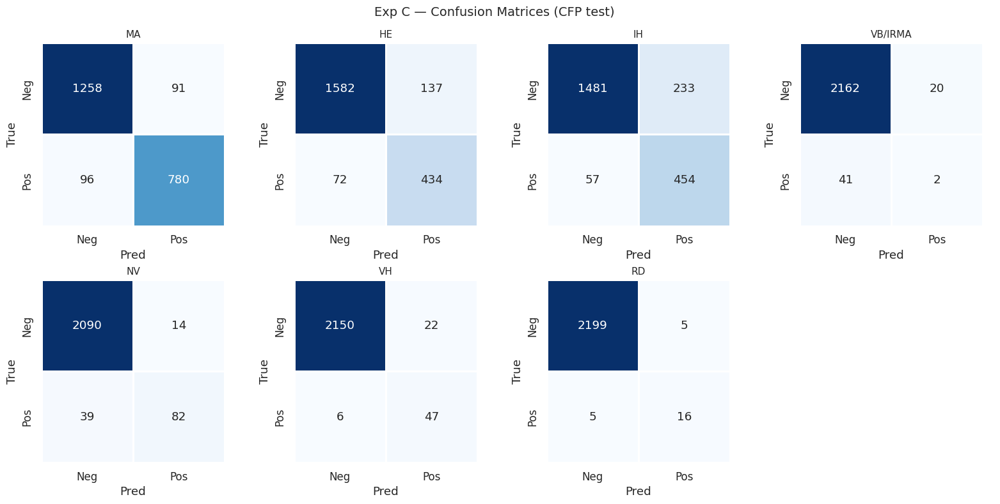

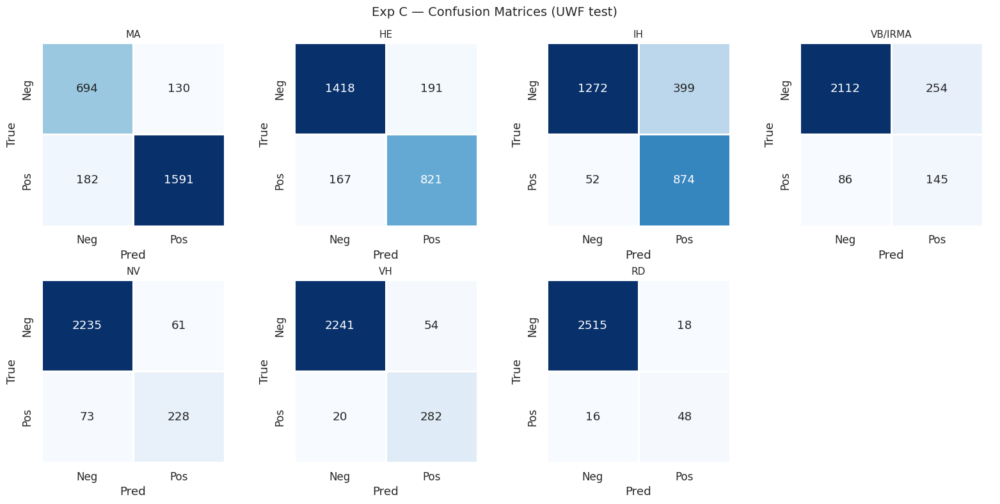

In [19]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrices(modality, exp_title):
    """Generate 2x2 confusion matrices for each lesion class (cached predictions)."""
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']
    thresholds = PRED_CACHE['thresholds']
    t = np.array([thresholds.get(n, 0.5) for n in LESION_NAMES])
    preds = (probs >= t).astype(int)

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — Confusion Matrices ({modality.upper()} test)', fontsize=14)

    for j, ax in enumerate(axes.flat[:7]):
        cm = confusion_matrix(labels[:, j], preds[:, j], labels=[0, 1])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                    xticklabels=['Neg', 'Pos'], yticklabels=['Neg', 'Pos'],
                    cbar=False, square=True, linewidths=1)
        ax.set_title(f'{LESION_DISPLAY[j]}', fontsize=11)
        ax.set_ylabel('True'); ax.set_xlabel('Pred')

    axes[1, 3].axis('off')
    plt.tight_layout()
    plt.show()

_exp_title = f"Exp {PRED_CACHE.get('exp_key', EXP_KEY).upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_confusion_matrices(mod, _exp_title)


---
## Section 12 — ROC Curves

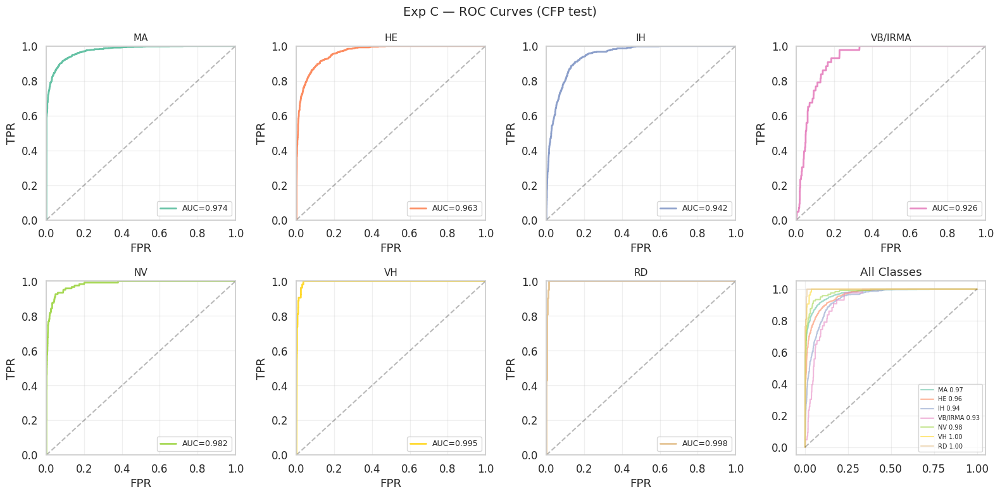

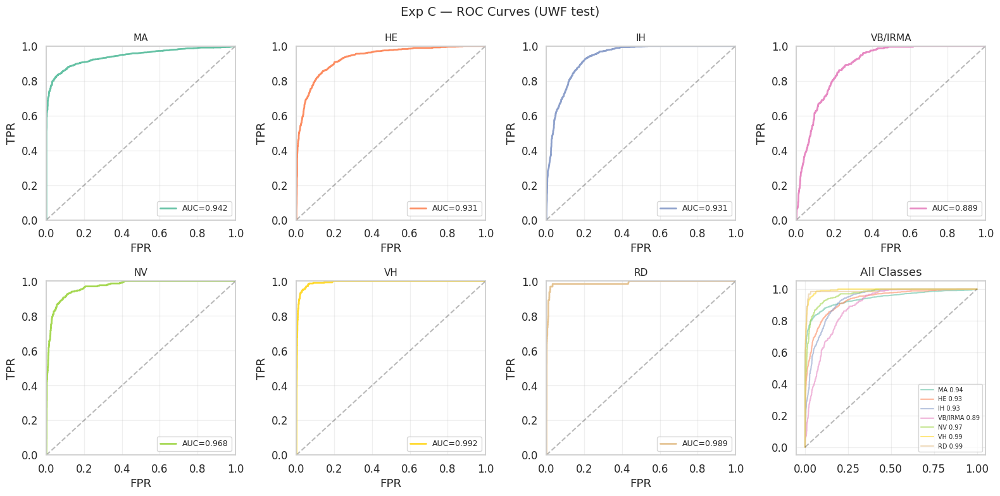

In [20]:
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_curves(modality, exp_title, exp_key):
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — ROC Curves ({modality.upper()} test)', fontsize=14)

    for j, ax in enumerate(axes.flat[:7]):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() == 0 or y_true.sum() == len(y_true):
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center'); ax.set_title(LESION_DISPLAY[j]); continue
        fpr, tpr, _ = roc_curve(y_true, y_score)
        auc = roc_auc_score(y_true, y_score)
        ax.plot(fpr, tpr, color=COLORS[j], linewidth=2, label=f'AUC={auc:.3f}')
        ax.plot([0,1], [0,1], 'k--', alpha=0.3)
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.set_title(f'{LESION_DISPLAY[j]}', fontsize=11)
        ax.legend(loc='lower right', fontsize=9); ax.grid(True, alpha=0.3)
        ax.set_xlim(0,1); ax.set_ylim(0,1)

    ax = axes[1, 3]
    for j in range(7):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() > 0 and y_true.sum() < len(y_true):
            fpr, tpr, _ = roc_curve(y_true, y_score)
            auc = roc_auc_score(y_true, y_score)
            ax.plot(fpr, tpr, color=COLORS[j], alpha=0.6, label=f'{LESION_DISPLAY[j]} {auc:.2f}')
    ax.plot([0,1], [0,1], 'k--', alpha=0.3)
    ax.set_title('All Classes'); ax.legend(fontsize=7); ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / f'roc_{exp_key}_{modality}.png'), dpi=100, bbox_inches='tight')
    plt.show()

_exp_key = PRED_CACHE.get('exp_key', EXP_KEY)
_exp_title = f"Exp {_exp_key.upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_roc_curves(mod, _exp_title, _exp_key)


---
## Section 13 — Precision-Recall Curves

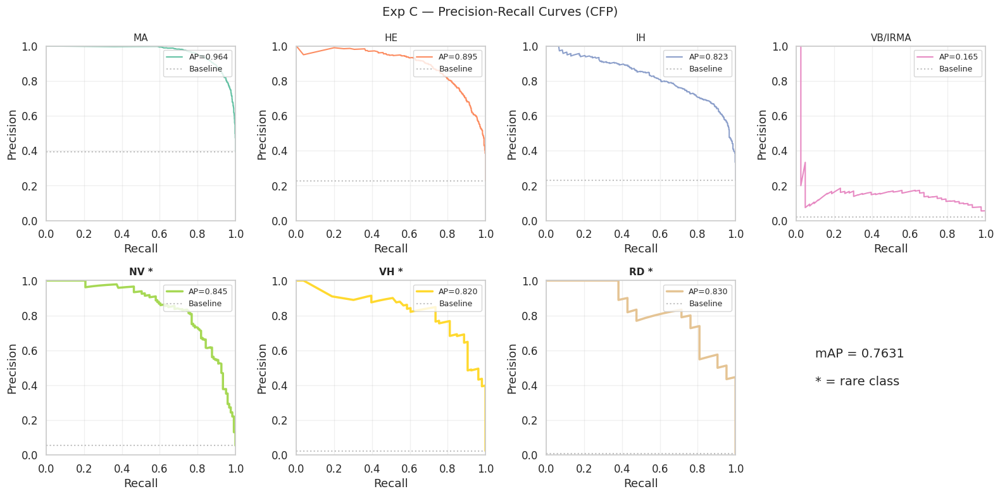

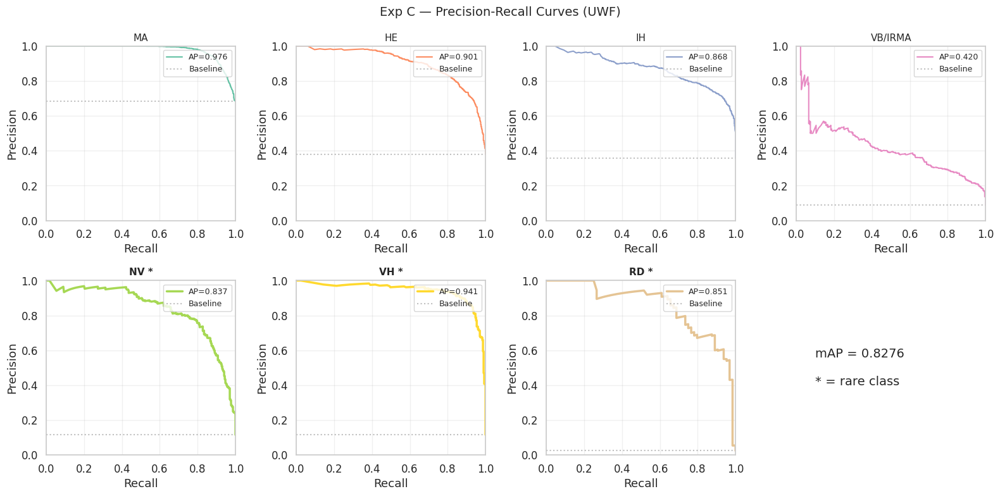

In [21]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def plot_pr_curves(modality, exp_title, exp_key):
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — Precision-Recall Curves ({modality.upper()})', fontsize=14)

    rare_classes = {'NV', 'VH', 'RD'}

    for j, ax in enumerate(axes.flat[:7]):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() == 0:
            ax.text(0.5, 0.5, 'No positives', ha='center', va='center')
            ax.set_title(LESION_DISPLAY[j]); continue
        prec, rec, _ = precision_recall_curve(y_true, y_score)
        ap = average_precision_score(y_true, y_score)
        lw = 2.5 if LESION_DISPLAY[j] in rare_classes else 1.5
        ax.plot(rec, prec, color=COLORS[j], linewidth=lw, label=f'AP={ap:.3f}')
        ax.axhline(y_true.mean(), color='gray', linestyle=':', alpha=0.5, label='Baseline')
        ax.set_xlabel('Recall'); ax.set_ylabel('Precision')
        is_rare = ' *' if LESION_DISPLAY[j] in rare_classes else ''
        ax.set_title(f'{LESION_DISPLAY[j]}{is_rare}', fontsize=11,
                     fontweight='bold' if LESION_DISPLAY[j] in rare_classes else 'normal')
        ax.legend(loc='upper right', fontsize=9); ax.grid(True, alpha=0.3)
        ax.set_xlim(0,1); ax.set_ylim(0,1)

    axes[1, 3].axis('off')
    mAP = np.mean([average_precision_score(labels[:, j], probs[:, j])
                   for j in range(7) if labels[:, j].sum() > 0])
    axes[1, 3].text(0.1, 0.5, f'mAP = {mAP:.4f}\n\n* = rare class',
                    fontsize=14, transform=axes[1, 3].transAxes, va='center')

    plt.tight_layout()
    plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / f'pr_{exp_key}_{modality}.png'), dpi=100, bbox_inches='tight')
    plt.show()

_exp_key = PRED_CACHE.get('exp_key', EXP_KEY)
_exp_title = f"Exp {_exp_key.upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_pr_curves(mod, _exp_title, _exp_key)


---
## Section 14 — Attention Visualization

Extract Q2L cross-attention maps using forward hooks (no source code modification).
Each of the 7 label queries attends to the 16x16 spatial feature grid differently.

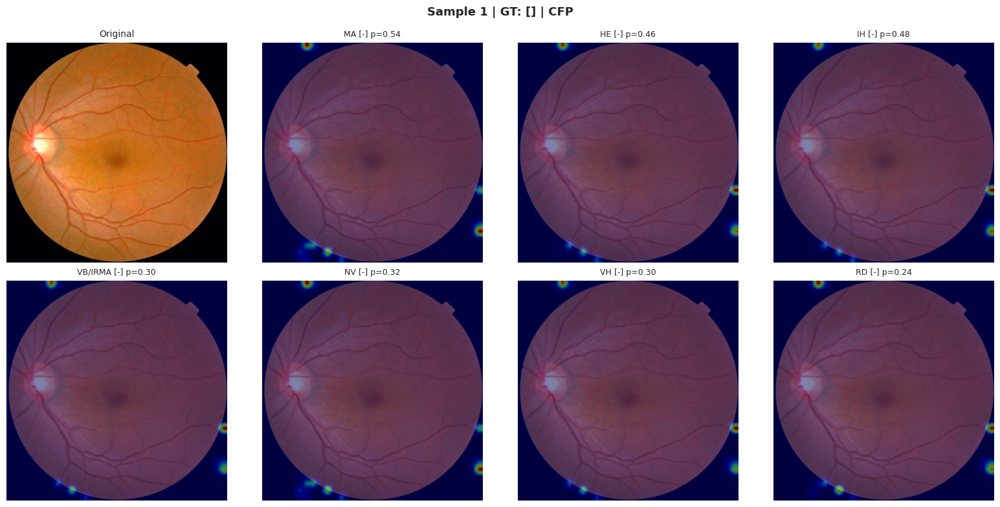

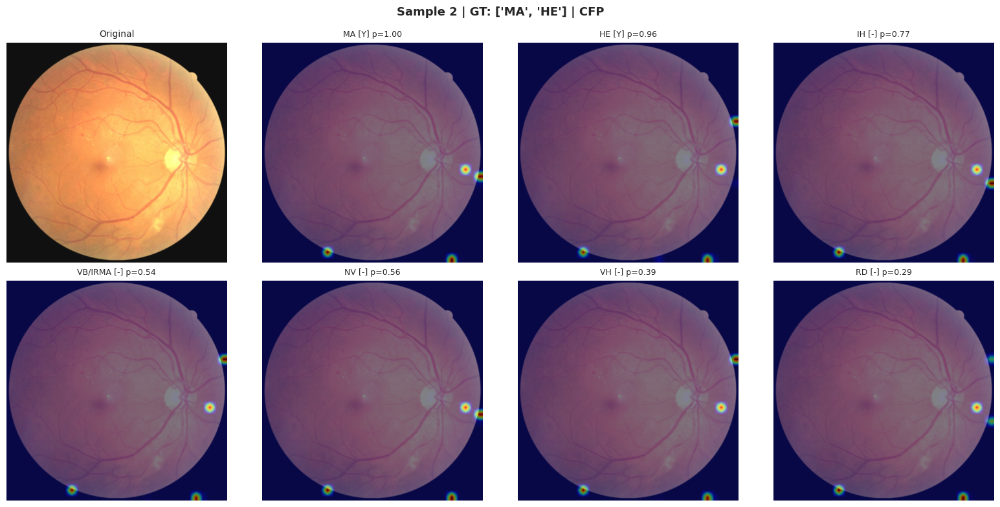

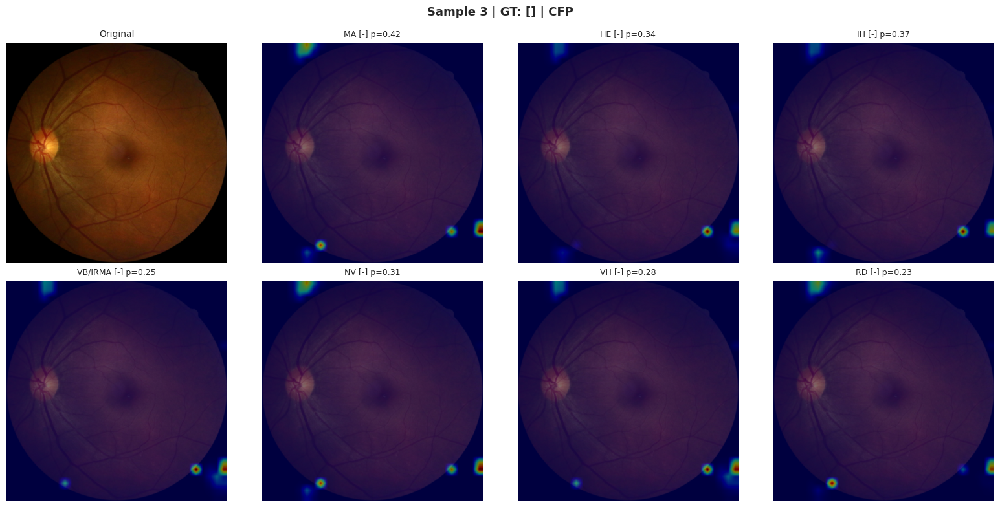

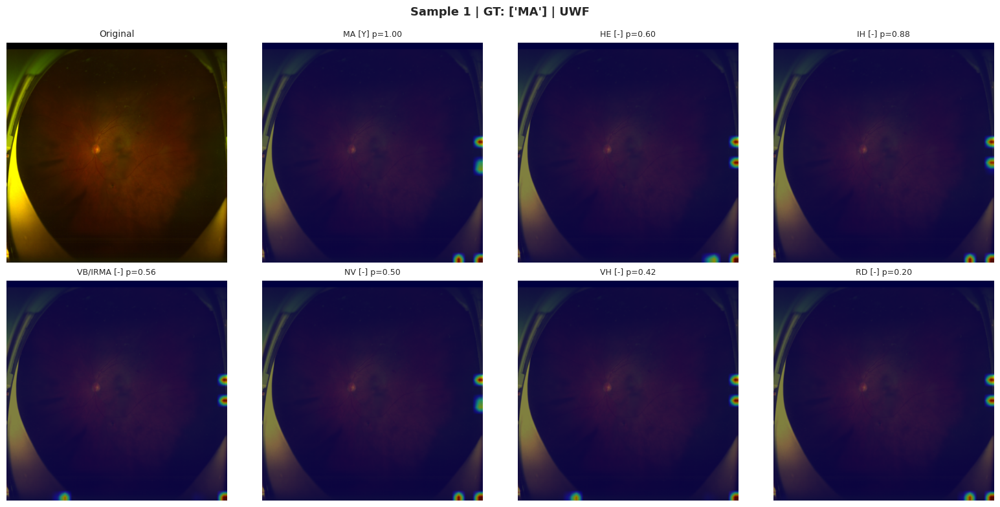

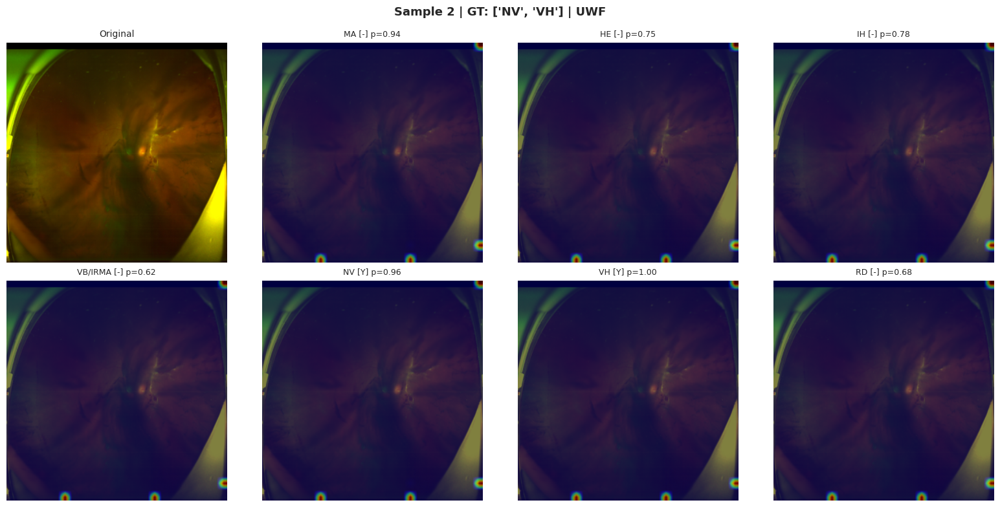

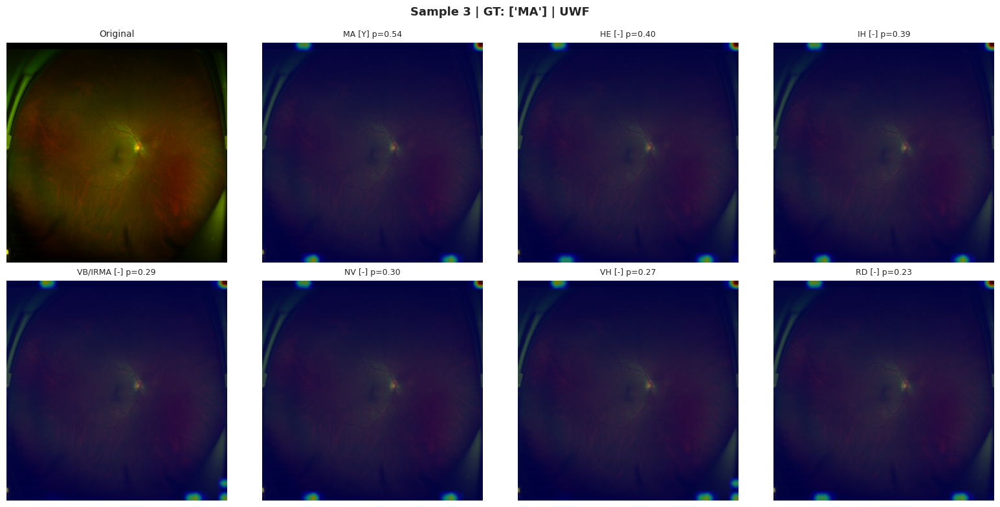

In [22]:
# Attention maps were captured during the single shared inference pass
# in Section 9 (PRED_CACHE['attention']) — no model reload needed here.

def visualize_attention(modality):
    """Visualize cached cross-attention maps for each label query."""
    if modality not in PRED_CACHE.get('attention', {}):
        print(f'No cached attention for {modality}.'); return

    data = PRED_CACHE['attention'][modality]
    images, labels, attn, logits = data['images'], data['labels'], data['attn'], data['logits']
    n_samples = images.size(0)

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    for sample_idx in range(n_samples):
        img_display = images[sample_idx] * std + mean
        img_display = img_display.permute(1, 2, 0).clamp(0, 1).numpy()

        lbl = labels[sample_idx].numpy()
        pred_probs = torch.sigmoid(logits[sample_idx]).numpy()
        present = [LESION_DISPLAY[i] for i in range(7) if lbl[i] == 1]

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle(f'Sample {sample_idx+1} | GT: {present} | {modality.upper()}',
                     fontsize=13, fontweight='bold')

        axes[0, 0].imshow(img_display)
        axes[0, 0].set_title('Original', fontsize=10)
        axes[0, 0].axis('off')

        for j, ax in enumerate(list(axes.flat[1:])):
            if j >= 7: ax.axis('off'); continue
            # RETFound migration: the decoder's spatial grid is
            # cfg.feature_map_size x cfg.feature_map_size (32x32=1024 tokens
            # under RETFound, was 16x16=256 under ConvNeXt-V2). Derive the
            # grid size from the actual captured attention tensor rather
            # than hardcoding it a second time, so this cell can't drift
            # out of sync with cfg.feature_map_size again in the future.
            _grid = int(round(attn.shape[-1] ** 0.5))
            assert _grid * _grid == attn.shape[-1], (
                f'Attention map size {attn.shape[-1]} is not a perfect square '
                f'— cannot infer spatial grid shape.'
            )
            attn_map = attn[sample_idx, j].reshape(_grid, _grid).numpy()
            attn_up = F.interpolate(
                torch.tensor(attn_map).unsqueeze(0).unsqueeze(0),
                size=(512, 512), mode='bilinear', align_corners=False
            ).squeeze().numpy()

            ax.imshow(img_display)
            ax.imshow(attn_up, cmap='jet', alpha=0.5, vmin=0)
            indicator = 'Y' if lbl[j] == 1 else '-'
            ax.set_title(f'{LESION_DISPLAY[j]} [{indicator}] p={pred_probs[j]:.2f}', fontsize=9)
            ax.axis('off')

        plt.tight_layout()
        plt.show()

for mod in PRED_CACHE.get('attention', {}):
    visualize_attention(mod)


---
## Section 15 — Modality Conditioning Visualization

Compare Exp D (CMQC) base queries vs modality-conditioned queries.

/home/user2/mydisk/sanchit/src/backbone.py:222: RuntimeWarning: torch.load(weights_only=True) failed on '/home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth' (UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL argparse.Namespace was not an allowed global by default. Please use `torch.serialization.add_safe_globals([argparse.Namespace])` or the `torch.serialization.safe_globals([argparse.Namespace])` c

RETFound-MEH checkpoint load report
  Checkpoint path      : /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth
  Checkpoint filename  : RETFound_mae_meh.pth
  Checkpoint keys      : 398
  Target model keys    : 294
  Matched (loaded)     : 294/294 (pos_embed interpolated 14x14->32x32)
  Missing (NOT loaded) : 0  (none — every backbone parameter received pretrained weights)
  Unexpected, expected (MAE decoder/mask_token, safely ignored): 104
  Unexpected, UNRECOGNIZED (potential real mismatch)          : 0
  ✅ RETFound-MEH checkpoint loaded successfully — 294/294 backbone parameters initialized from pretrained weights. Model is NOT training from random initialization.


/home/user2/miniconda/envs/gpu-env/lib/python3.10/site-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


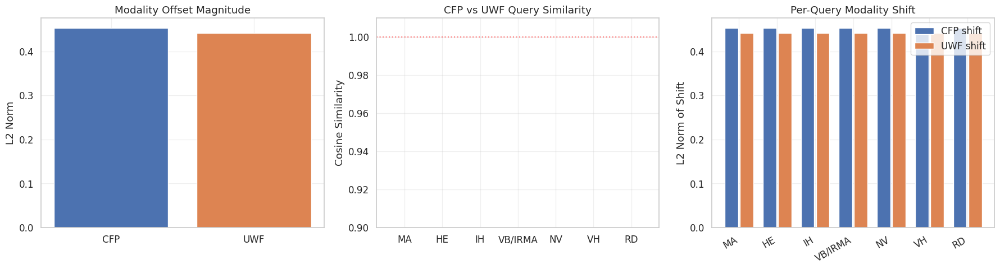

In [23]:
def visualize_modality_conditioning():
    cfg = get_config('d', project_root=PROJECT_ROOT)
    ckpt_path = cfg.output_dir / 'best_model.pth'
    if not ckpt_path.exists():
        print('Exp D not run yet. Skipping.'); return
    
    mdl = Q2LLesionModel(cfg, weights_path=BACKBONE_WEIGHTS).to(DEVICE)
    ckpt = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    mdl.load_state_dict(ckpt.get('ema_state_dict', ckpt['model_state_dict']))
    mdl.eval()
    
    # Extract learned embeddings
    base_queries = mdl.decoder.label_queries.detach().cpu()  # (7, 1024)
    mod_offsets = mdl.decoder.modality_offset.weight.detach().cpu()  # (2, 1024)
    cfp_offset = mod_offsets[0]  # (1024,)
    uwf_offset = mod_offsets[1]  # (1024,)
    
    cfp_queries = base_queries + cfp_offset.unsqueeze(0)
    uwf_queries = base_queries + uwf_offset.unsqueeze(0)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # 1: Offset norms
    ax = axes[0]
    norms = [cfp_offset.norm().item(), uwf_offset.norm().item()]
    ax.bar(['CFP', 'UWF'], norms, color=['#4C72B0', '#DD8452'], edgecolor='white')
    ax.set_ylabel('L2 Norm'); ax.set_title('Modality Offset Magnitude')
    ax.grid(True, alpha=0.3)
    
    # 2: Cosine similarity between CFP and UWF queries
    ax = axes[1]
    cos_sims = F.cosine_similarity(cfp_queries, uwf_queries, dim=1).numpy()
    bars = ax.bar(LESION_DISPLAY, cos_sims, color=COLORS, edgecolor='white')
    ax.set_ylabel('Cosine Similarity'); ax.set_title('CFP vs UWF Query Similarity')
    ax.set_ylim(0.9, 1.01); ax.grid(True, alpha=0.3)
    ax.axhline(1.0, color='red', linestyle=':', alpha=0.5)
    
    # 3: Query shift per lesion (how much each query changes by modality)
    ax = axes[2]
    cfp_shift = (cfp_queries - base_queries).norm(dim=1).numpy()
    uwf_shift = (uwf_queries - base_queries).norm(dim=1).numpy()
    x = np.arange(7)
    ax.bar(x - 0.2, cfp_shift, 0.35, label='CFP shift', color='#4C72B0')
    ax.bar(x + 0.2, uwf_shift, 0.35, label='UWF shift', color='#DD8452')
    ax.set_xticks(x); ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
    ax.set_ylabel('L2 Norm of Shift'); ax.set_title('Per-Query Modality Shift')
    ax.legend(); ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / 'modality_conditioning.png'), dpi=100, bbox_inches='tight')
    plt.show()
    del mdl; torch.cuda.empty_cache()

visualize_modality_conditioning()

---
## Section 16 — Error Analysis

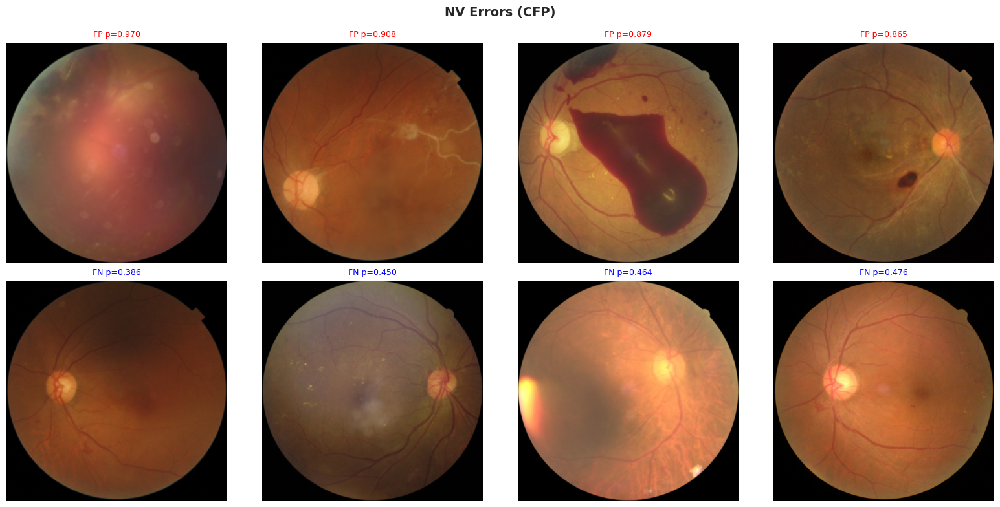

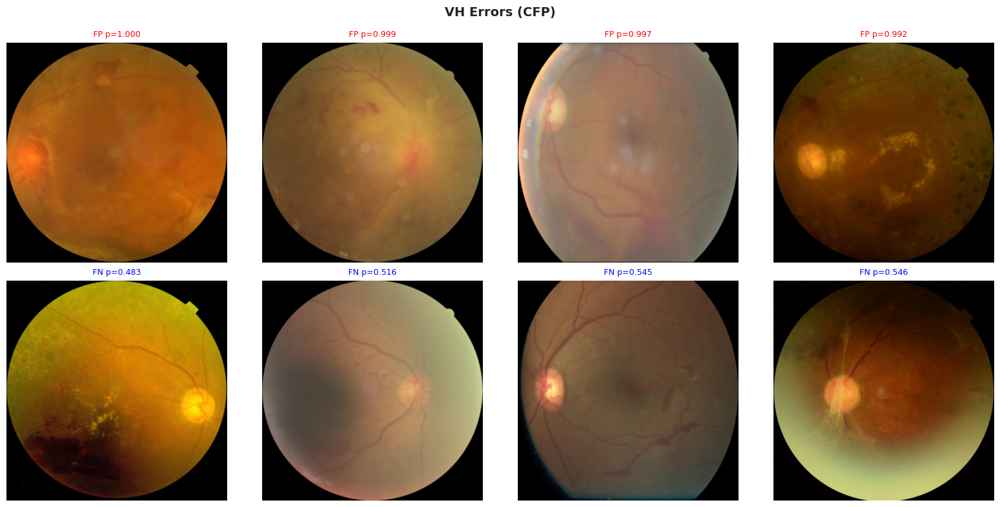

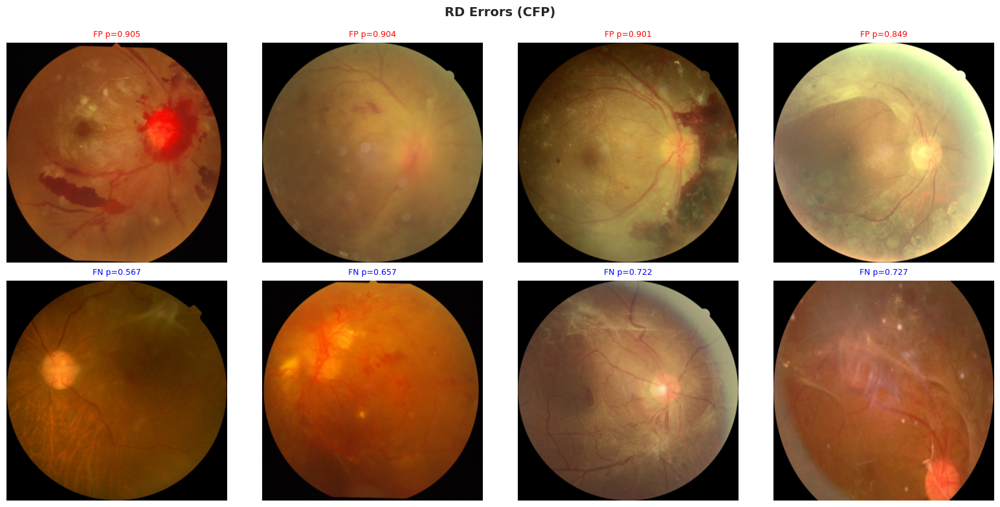

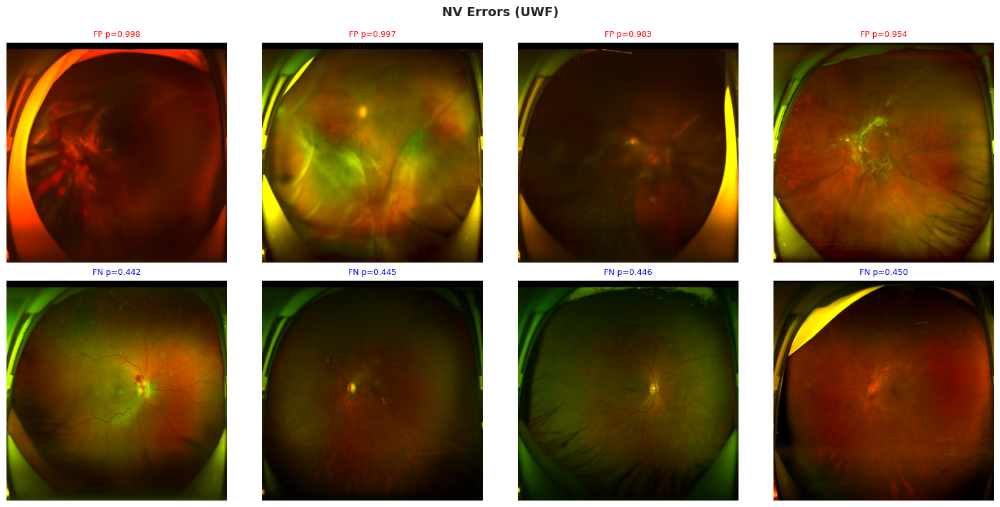

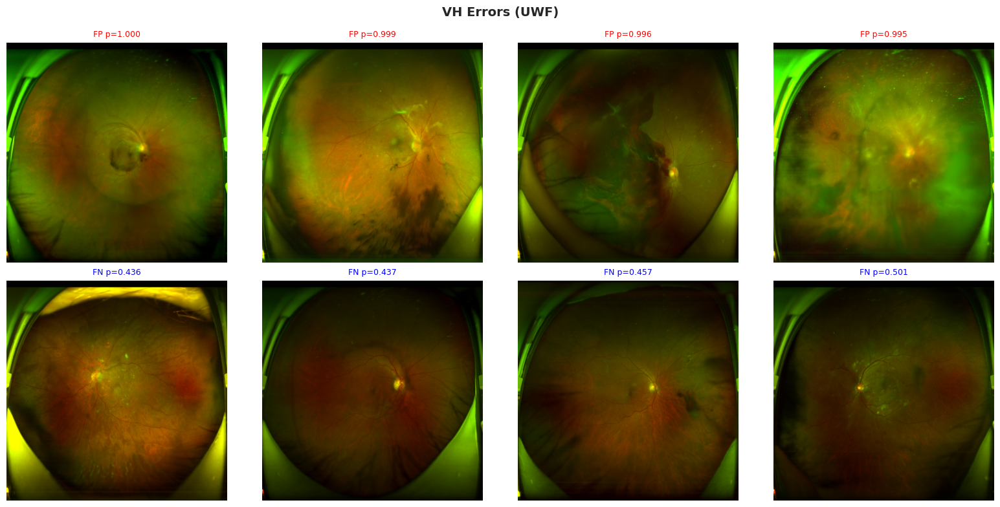

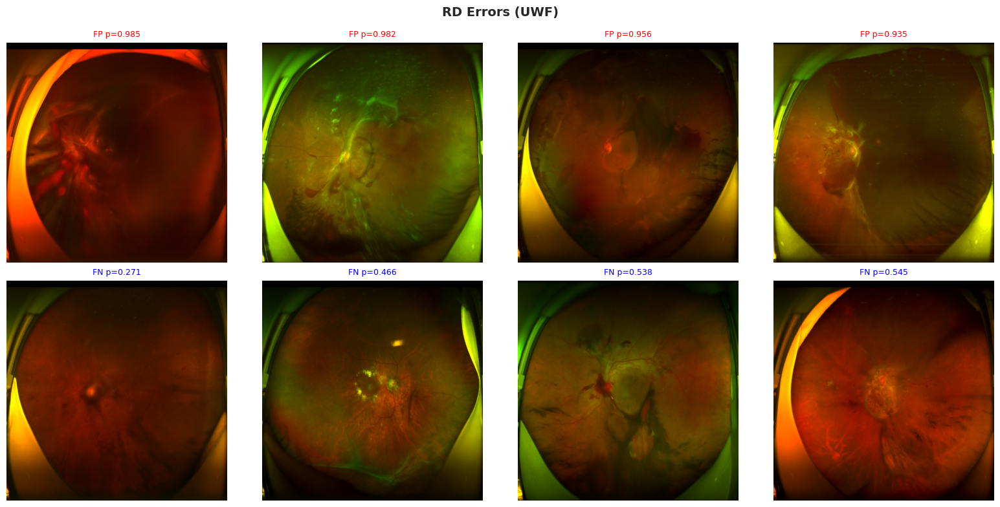

In [24]:
def error_analysis(modality, top_k=6):
    """Show worst false positives and false negatives for rare classes
    (uses cached test predictions — only the handful of images shown
    here are loaded individually)."""
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']
    test_ds = PRED_CACHE['test'][modality]['dataset']
    thresholds = PRED_CACHE['thresholds']

    rare_indices = [4, 5, 6]  # NV, VH, RD

    for j in rare_indices:
        name = LESION_DISPLAY[j]
        t = thresholds.get(LESION_NAMES[j], 0.5)
        preds_j = (probs[:, j] >= t).astype(int)

        fp_mask = (preds_j == 1) & (labels[:, j] == 0)
        fp_indices = np.where(fp_mask)[0]
        fp_sorted = fp_indices[np.argsort(-probs[fp_indices, j])][:top_k]

        fn_mask = (preds_j == 0) & (labels[:, j] == 1)
        fn_indices = np.where(fn_mask)[0]
        fn_sorted = fn_indices[np.argsort(probs[fn_indices, j])][:top_k]

        if len(fp_sorted) == 0 and len(fn_sorted) == 0:
            print(f'{name}: No errors!'); continue

        n_show = max(len(fp_sorted), len(fn_sorted))
        fig, axes = plt.subplots(2, max(n_show, 1), figsize=(4*n_show, 8))
        if n_show == 1: axes = axes.reshape(2, 1)
        fig.suptitle(f'{name} Errors ({modality.upper()})', fontsize=14, fontweight='bold')

        for col in range(n_show):
            ax = axes[0, col]
            if col < len(fp_sorted):
                idx = fp_sorted[col]
                img, lbl, _ = test_ds[idx]
                img_show = img * torch.tensor([0.229,0.224,0.225]).view(3,1,1) + torch.tensor([0.485,0.456,0.406]).view(3,1,1)
                ax.imshow(img_show.permute(1,2,0).clamp(0,1).numpy())
                ax.set_title(f'FP p={probs[idx,j]:.3f}', fontsize=9, color='red')
            ax.axis('off')
            if col == 0: ax.set_ylabel('False Positives', fontsize=12)

            ax = axes[1, col]
            if col < len(fn_sorted):
                idx = fn_sorted[col]
                img, lbl, _ = test_ds[idx]
                img_show = img * torch.tensor([0.229,0.224,0.225]).view(3,1,1) + torch.tensor([0.485,0.456,0.406]).view(3,1,1)
                ax.imshow(img_show.permute(1,2,0).clamp(0,1).numpy())
                ax.set_title(f'FN p={probs[idx,j]:.3f}', fontsize=9, color='blue')
            ax.axis('off')
            if col == 0: ax.set_ylabel('False Negatives', fontsize=12)

        plt.tight_layout()
        plt.show()

for mod in PRED_CACHE.get('test', {}):
    error_analysis(mod, top_k=4)


---
## Section 17 — Final Results Dashboard

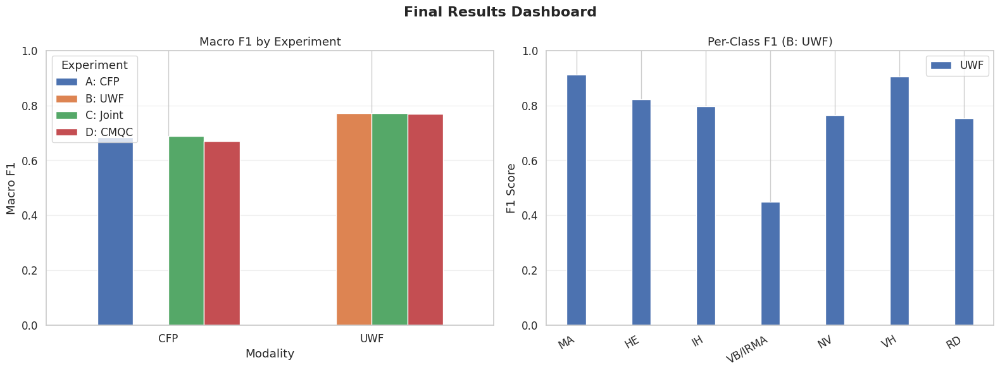


=== Complete Results ===


,Experiment,Modality,Macro F1,Accuracy,Exact Match,MA,HE,IH,VB/IRMA,NV,VH,RD
0,A: CFP,CFP,0.6843,0.9374,0.6881,0.8736,0.7832,0.7246,0.2514,0.7608,0.7679,0.6286
1,B: UWF,UWF,0.7717,0.9074,0.5129,0.9108,0.8231,0.7955,0.4488,0.7643,0.9054,0.7538
2,C: Joint,CFP,0.6876,0.9463,0.7258,0.8920,0.8045,0.7588,0.0625,0.7442,0.7705,0.7805
3,C: Joint,UWF,0.7704,0.9067,0.5098,0.9095,0.8202,0.7962,0.4659,0.7791,0.8833,0.7385
4,D: CMQC,CFP,0.6702,0.9445,0.7119,0.8820,0.8011,0.7570,0.0606,0.7282,0.7586,0.7037
5,D: CMQC,UWF,0.7696,0.9052,0.5067,0.9074,0.8173,0.7942,0.4657,0.7645,0.8841,0.7536



Best: B: UWF on UWF (Macro F1 = 0.7717)


In [25]:
def final_dashboard():
    all_results = load_all_results()
    if not all_results:
        print('No results. Run experiments first.'); return
    
    # Aggregate metrics
    rows = []
    for exp_label, res in all_results.items():
        for modality, mdata in res.items():
            m = mdata.get('metrics_at_optimized', {})
            rows.append({
                'Experiment': exp_label, 'Modality': modality.upper(),
                'Macro F1': m.get('macro_f1', 0),
                'Accuracy': m.get('element_accuracy', 0),
                'Exact Match': m.get('exact_match', 0),
                **{LESION_DISPLAY[i]: m.get(f'{LESION_NAMES[i]}_f1', 0) for i in range(7)}
            })
    
    df = pd.DataFrame(rows)
    
    # Grouped bar chart
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Final Results Dashboard', fontsize=16, fontweight='bold')
    
    # Left: Macro F1 by experiment and modality
    ax = axes[0]
    pivot = df.pivot(index='Modality', columns='Experiment', values='Macro F1')
    pivot.plot(kind='bar', ax=ax, edgecolor='white', width=0.7)
    ax.set_ylabel('Macro F1'); ax.set_title('Macro F1 by Experiment')
    ax.set_ylim(0, 1); ax.legend(title='Experiment')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    
    # Right: Per-class F1 for best experiment
    ax = axes[1]
    best_exp = df.loc[df['Macro F1'].idxmax(), 'Experiment']
    best_rows = df[df['Experiment'] == best_exp]
    x = np.arange(7)
    for i, (_, row) in enumerate(best_rows.iterrows()):
        vals = [row[LESION_DISPLAY[j]] for j in range(7)]
        offset = (i - len(best_rows)/2 + 0.5) * 0.35
        ax.bar(x + offset, vals, 0.3, label=row['Modality'], edgecolor='white')
    ax.set_xticks(x); ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
    ax.set_ylabel('F1 Score'); ax.set_title(f'Per-Class F1 ({best_exp})')
    ax.set_ylim(0, 1); ax.legend(); ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig(str(pathlib.Path(PROJECT_ROOT) / 'outputs' / 'final_dashboard.png'), dpi=100, bbox_inches='tight')
    plt.show()
    
    # Print styled table
    print('\n=== Complete Results ===')
    display(df.style.highlight_max(subset=['Macro F1'], color='lightgreen', axis=0)
              .format(precision=4))
    
    # Best model
    best_idx = df['Macro F1'].idxmax()
    print(f"\nBest: {df.loc[best_idx, 'Experiment']} on {df.loc[best_idx, 'Modality']} "
          f"(Macro F1 = {df.loc[best_idx, 'Macro F1']:.4f})")

final_dashboard()

---
## Section 18 — Model Export & Inference

In [26]:
def export_best_model(exp_key=None):
    """Export best model checkpoint + thresholds for deployment."""
    exp_key = exp_key or PRED_CACHE.get('exp_key', EXP_KEY)
    cfg_e = get_config(exp_key, project_root=PROJECT_ROOT)
    ckpt_path = cfg_e.output_dir / 'best_model.pth'
    thresh_path = cfg_e.output_dir / 'thresholds.json'

    if not ckpt_path.exists():
        print('No checkpoint found.'); return

    export_dir = pathlib.Path(PROJECT_ROOT) / 'outputs' / 'export'
    export_dir.mkdir(parents=True, exist_ok=True)

    import shutil
    shutil.copy2(ckpt_path, export_dir / 'model.pth')
    if thresh_path.exists():
        shutil.copy2(thresh_path, export_dir / 'thresholds.json')
    cfg_e.save(export_dir / 'config.json')

    print(f'Exported to {export_dir}/')
    print(f'  model.pth        ({ckpt_path.stat().st_size / 1e6:.1f} MB)')
    print(f'  thresholds.json')
    print(f'  config.json')

export_best_model()


Exported to /home/user2/mydisk/sanchit/outputs/export/
  model.pth        (2836.7 MB)
  thresholds.json
  config.json


/home/user2/mydisk/sanchit/src/backbone.py:222: RuntimeWarning: torch.load(weights_only=True) failed on '/home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth' (UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL argparse.Namespace was not an allowed global by default. Please use `torch.serialization.add_safe_globals([argparse.Namespace])` or the `torch.serialization.safe_globals([argparse.Namespace])` c

RETFound-MEH checkpoint load report
  Checkpoint path      : /home/user2/mydisk/sanchit/weights/RETFound_mae_meh.pth
  Checkpoint filename  : RETFound_mae_meh.pth
  Checkpoint keys      : 398
  Target model keys    : 294
  Matched (loaded)     : 294/294 (pos_embed interpolated 14x14->32x32)
  Missing (NOT loaded) : 0  (none — every backbone parameter received pretrained weights)
  Unexpected, expected (MAE decoder/mask_token, safely ignored): 104
  Unexpected, UNRECOGNIZED (potential real mismatch)          : 0
  ✅ RETFound-MEH checkpoint loaded successfully — 294/294 backbone parameters initialized from pretrained weights. Model is NOT training from random initialization.


/home/user2/miniconda/envs/gpu-env/lib/python3.10/site-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


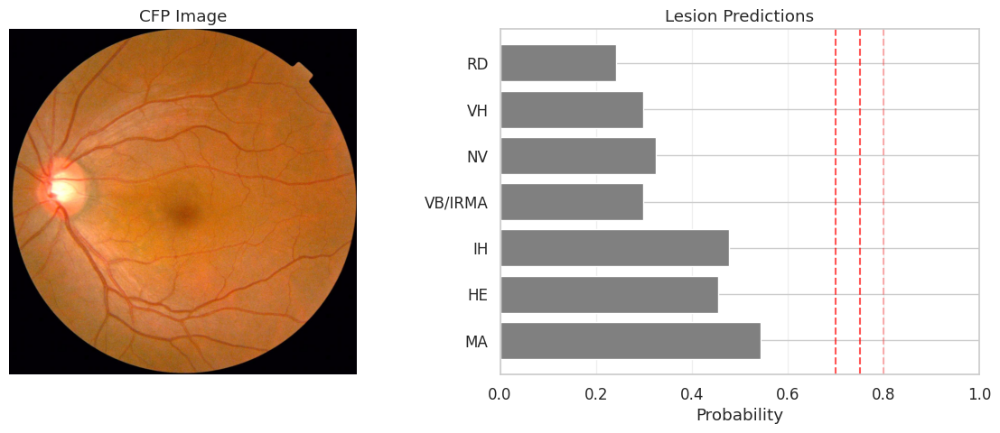

Detected lesions: None


In [27]:
from src.dataset import get_val_transform

def predict_single_image(image_path, exp_key=None, modality='cfp'):
    """Run inference on a single image (loads model on demand)."""
    exp_key = exp_key or PRED_CACHE.get('exp_key', EXP_KEY)
    mdl, cfg_e = load_experiment_model(exp_key)
    if mdl is None:
        print('No checkpoint found.'); return

    thresh_path = cfg_e.output_dir / 'thresholds.json'
    with open(thresh_path) as f:
        thresholds = json.load(f)

    transform = get_val_transform()
    img = Image.open(image_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(DEVICE)
    mod_id = torch.tensor([0 if modality == 'cfp' else 1], device=DEVICE)

    with torch.no_grad(), torch.amp.autocast(device_type='cuda', enabled=True):
        logits = mdl(img_tensor, mod_id)
    probs = torch.sigmoid(logits).cpu().numpy()[0]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.imshow(img); ax1.set_title(f'{modality.upper()} Image'); ax1.axis('off')

    colors_pred = ['green' if probs[i] >= thresholds.get(LESION_NAMES[i], 0.5) else 'gray'
                   for i in range(7)]
    bars = ax2.barh(LESION_DISPLAY, probs, color=colors_pred, edgecolor='white')
    for i, t in enumerate([thresholds.get(n, 0.5) for n in LESION_NAMES]):
        ax2.axvline(t, color='red', alpha=0.3, linestyle='--')
    ax2.set_xlabel('Probability'); ax2.set_title('Lesion Predictions')
    ax2.set_xlim(0, 1); ax2.grid(True, alpha=0.3, axis='x')

    plt.tight_layout()
    plt.show()

    detected = [LESION_DISPLAY[i] for i in range(7)
                if probs[i] >= thresholds.get(LESION_NAMES[i], 0.5)]
    print(f"Detected lesions: {detected if detected else 'None'}")

    del mdl; torch.cuda.empty_cache()

# Example: predict on a test image
sample_img = DATA_DIR / 'MMRDR-CFP' / 'img' / 'ts000001.jpg'
if sample_img.exists():
    predict_single_image(sample_img, modality='cfp')
else:
    print(f'Sample image not found at {sample_img}')


---
## End

All experiments complete. Results are saved in `outputs/`.